# Verify that new port of mean-state acceleration is working correctly

* Verify that preported code on GPU-updated branch (*GPU-pre*) is comparable to earlier verified control simulation (*CTL*)
* Verify that short 1-day GPU ported code (*GPU*) is comparable to preported code

In [1]:
import xarray as xr
import numpy as np
import e3sm_utils as eu

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
from e3sm_utils import e3sm_utils_se as ese

In [4]:
from e3sm_utils import cmclimate

In [5]:
import os

In [62]:
fname = '/global/project/projectdirs/m3312/crjones/e3sm/ne30_sp_io_test/run/ne30_sp_io_test.cam.h3.0001-01-01-00000.nc'
ds_crm = xr.open_dataset(fname)
ds_crm

<xarray.Dataset>
Dimensions:                          (crm_nx: 64, crm_nx_rad: 4, crm_ny: 1, crm_ny_rad: 1, crm_nz: 58, ilev: 73, lev: 72, nbnd: 2, ncol_100w_to_96w_32n_to_36n: 21, time: 121)
Coordinates:
  * lev                              (lev) float64 0.1238 0.1828 ... 993.8 998.5
  * ilev                             (ilev) float64 0.1 0.1477 ... 997.0 1e+03
  * time                             (time) object 0001-01-01 00:00:00 ... 0001-01-06 00:00:00
Dimensions without coordinates: crm_nx, crm_nx_rad, crm_ny, crm_ny_rad, crm_nz, nbnd, ncol_100w_to_96w_32n_to_36n
Data variables:
    lat_100w_to_96w_32n_to_36n       (ncol_100w_to_96w_32n_to_36n) float64 ...
    lon_100w_to_96w_32n_to_36n       (ncol_100w_to_96w_32n_to_36n) float64 ...
    hyam                             (lev) float64 ...
    hybm                             (lev) float64 ...
    P0                               float64 ...
    hyai                             (ilev) float64 ...
    hybi                             

In [7]:
fname = '/global/project/projectdirs/m3312/crjones/e3sm/ne120_sp_64x1_io/ne120_sp_64x1_io.cam.h3.0001-01-01-00000.nc'
ds_crm = xr.open_dataset(fname)

In [8]:
ds_crm

<xarray.Dataset>
Dimensions:                                   (crm_nx: 64, crm_nx_rad: 4, crm_ny: 1, crm_ny_rad: 1, crm_nz: 58, ilev: 73, lev: 72, nbnd: 2, ncol_97.8w_to_97.2w_36.27n_to_36.75n: 9, time: 121)
Coordinates:
  * lev                                       (lev) float64 0.1238 ... 998.5
  * ilev                                      (ilev) float64 0.1 ... 1e+03
  * time                                      (time) object 0001-01-01 00:00:00 ... 0001-01-06 00:00:00
Dimensions without coordinates: crm_nx, crm_nx_rad, crm_ny, crm_ny_rad, crm_nz, nbnd, ncol_97.8w_to_97.2w_36.27n_to_36.75n
Data variables:
    lat_97.8w_to_97.2w_36.27n_to_36.75n       (ncol_97.8w_to_97.2w_36.27n_to_36.75n) float64 ...
    lon_97.8w_to_97.2w_36.27n_to_36.75n       (ncol_97.8w_to_97.2w_36.27n_to_36.75n) float64 ...
    hyam                                      (lev) float64 ...
    hybm                                      (lev) float64 ...
    P0                                        float64 ...
   

In [42]:
ds_crm

<xarray.Dataset>
Dimensions:                                   (crm_nx: 64, crm_nx_rad: 4, crm_ny: 1, crm_ny_rad: 1, crm_nz: 58, ilev: 73, lev: 72, nbnd: 2, ncol_97.8w_to_97.2w_36.27n_to_36.75n: 9, time: 121)
Coordinates:
  * lev                                       (lev) float64 0.1238 ... 998.5
  * ilev                                      (ilev) float64 0.1 ... 1e+03
  * time                                      (time) object 0001-01-01 00:00:00 ... 0001-01-06 00:00:00
Dimensions without coordinates: crm_nx, crm_nx_rad, crm_ny, crm_ny_rad, crm_nz, nbnd, ncol_97.8w_to_97.2w_36.27n_to_36.75n
Data variables:
    lat_97.8w_to_97.2w_36.27n_to_36.75n       (ncol_97.8w_to_97.2w_36.27n_to_36.75n) float64 ...
    lon_97.8w_to_97.2w_36.27n_to_36.75n       (ncol_97.8w_to_97.2w_36.27n_to_36.75n) float64 ...
    hyam                                      (lev) float64 ...
    hybm                                      (lev) float64 ...
    P0                                        float64 ...
   

In [63]:
ds_crm = ds_crm.assign_coords(time=range(len(ds_crm.time.values)))

In [64]:
varlist2 = [v for v in ds_crm.variables if "to" in v and v[0:3] != 'CRM' and v[0:3] not in ('lat', 'lon', 'PS_')]
print(varlist2)

['CLDICE_100w_to_96w_32n_to_36n', 'CLDLIQ_100w_to_96w_32n_to_36n', 'OMEGA_100w_to_96w_32n_to_36n', 'Q_100w_to_96w_32n_to_36n', 'T_100w_to_96w_32n_to_36n', 'U_100w_to_96w_32n_to_36n', 'V_100w_to_96w_32n_to_36n', 'Z3_100w_to_96w_32n_to_36n']


In [65]:
varlist = [v for v in ds_crm.variables if "to" in v and v[0:3] == 'CRM']
print(varlist)

['CRM_QC_100w_to_96w_32n_to_36n', 'CRM_QI_100w_to_96w_32n_to_36n', 'CRM_QPC_100w_to_96w_32n_to_36n', 'CRM_QPI_100w_to_96w_32n_to_36n', 'CRM_QRAD_100w_to_96w_32n_to_36n', 'CRM_QV_100w_to_96w_32n_to_36n', 'CRM_T_100w_to_96w_32n_to_36n', 'CRM_U_100w_to_96w_32n_to_36n', 'CRM_W_100w_to_96w_32n_to_36n']


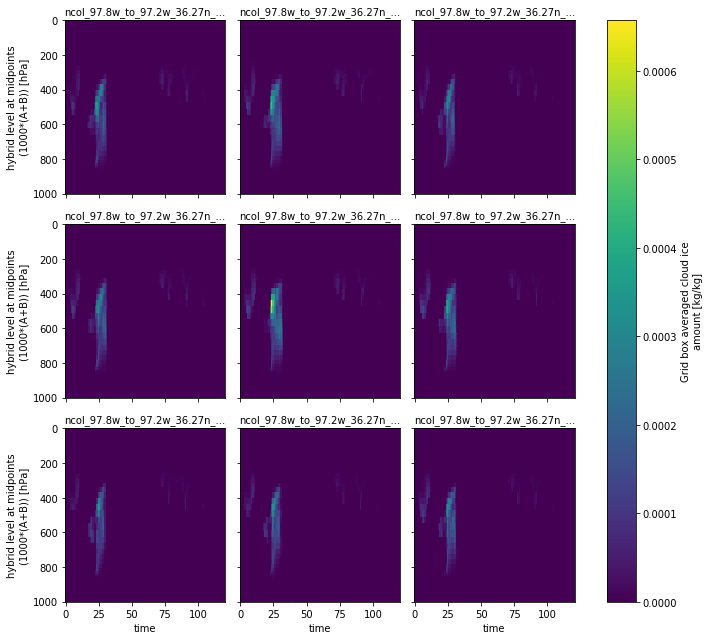

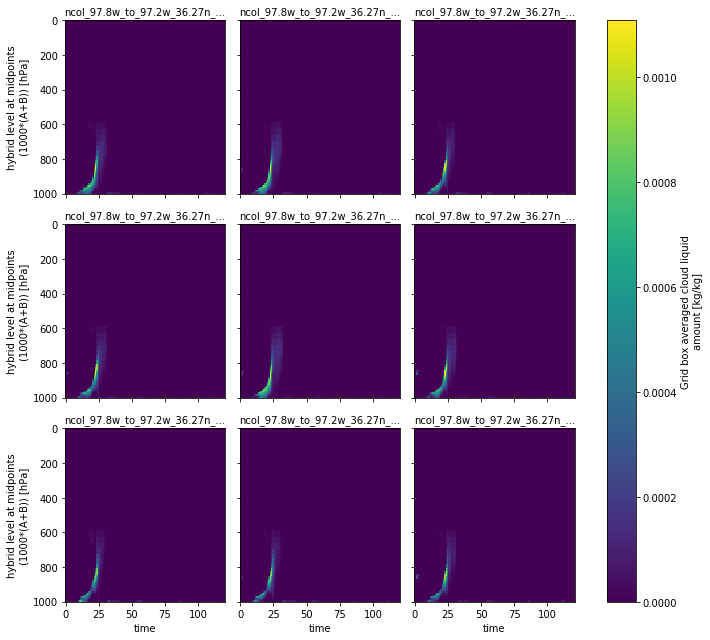

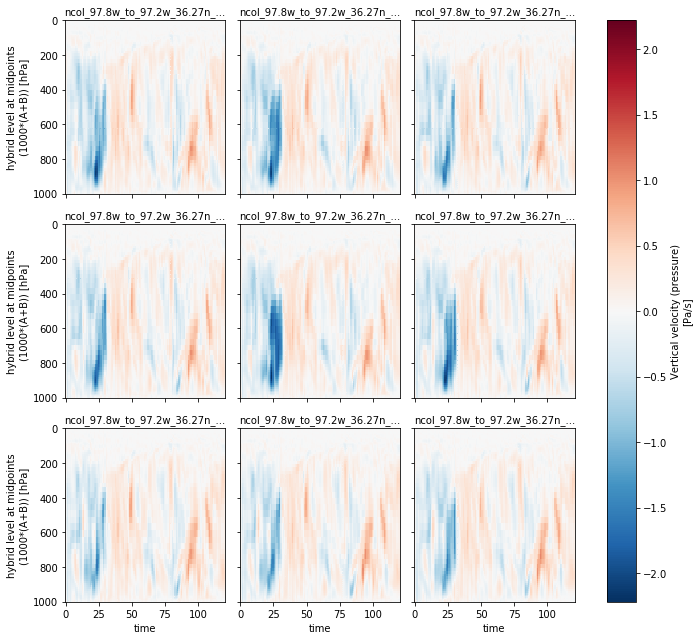

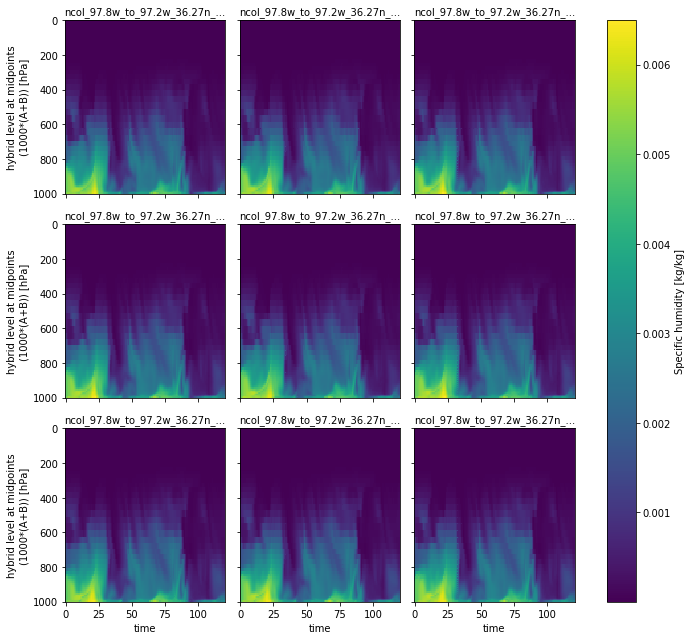

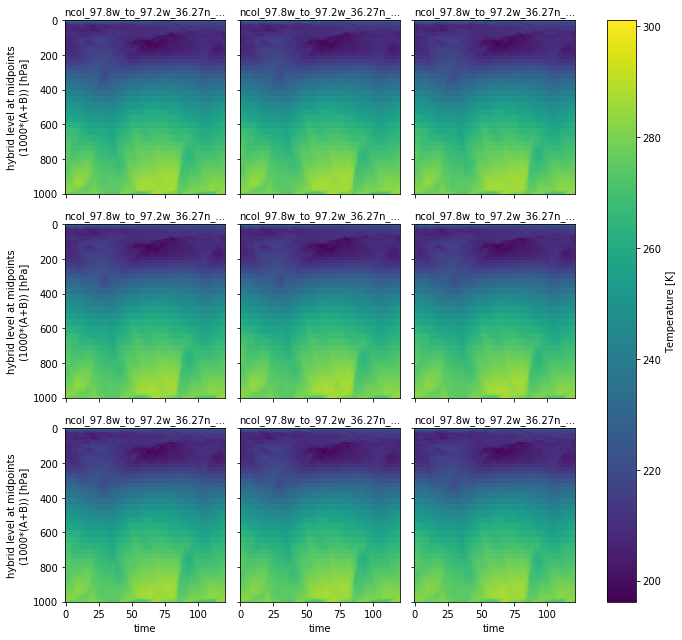

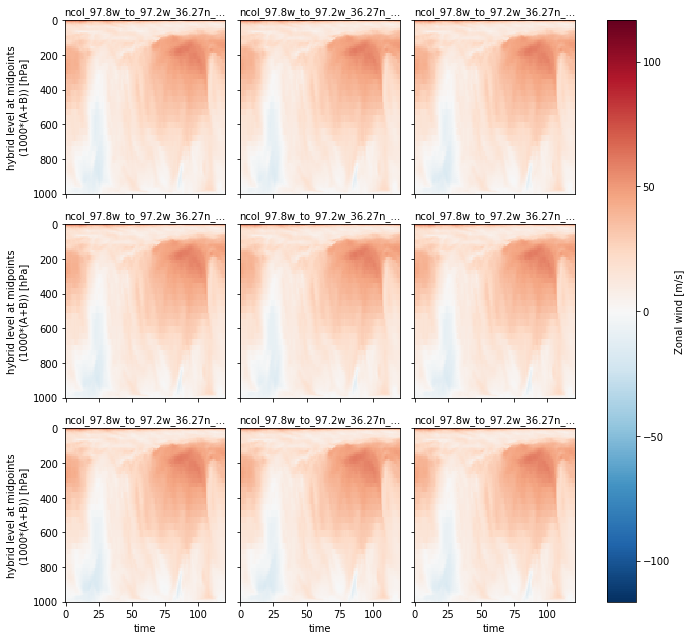

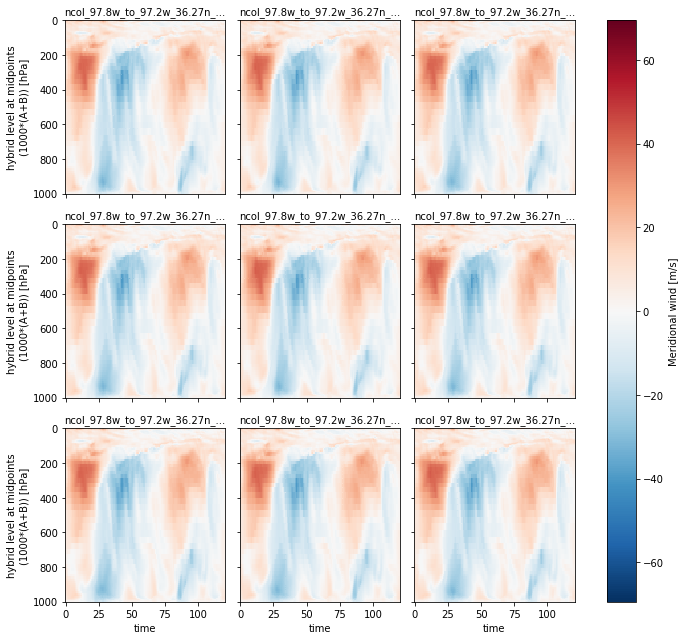

In [47]:
for v in varlist2:
    ds_crm[v].plot(x='time', y='lev', col='ncol_97.8w_to_97.2w_36.27n_to_36.75n', col_wrap=3, yincrease=False);

In [50]:
ds_crm.lev[::-1]

<xarray.DataArray 'lev' (lev: 72)>
array([9.984964e+02, 9.937570e+02, 9.862053e+02, 9.773141e+02, 9.679111e+02,
       9.580128e+02, 9.476362e+02, 9.367990e+02, 9.255197e+02, 9.138175e+02,
       9.017118e+02, 8.892227e+02, 8.763706e+02, 8.631764e+02, 8.496612e+02,
       8.350952e+02, 8.178688e+02, 7.969527e+02, 7.723628e+02, 7.444748e+02,
       7.137046e+02, 6.804980e+02, 6.453200e+02, 6.086438e+02, 5.706249e+02,
       5.316395e+02, 4.924686e+02, 4.543958e+02, 4.188035e+02, 3.859990e+02,
       3.557641e+02, 3.278975e+02, 3.022136e+02, 2.785416e+02, 2.567237e+02,
       2.366148e+02, 2.180810e+02, 2.009989e+02, 1.852549e+02, 1.707441e+02,
       1.573699e+02, 1.450433e+02, 1.336822e+02, 1.232110e+02, 1.135600e+02,
       1.046650e+02, 9.646667e+01, 8.891054e+01, 8.194628e+01, 7.535534e+01,
       6.847639e+01, 6.101518e+01, 5.330956e+01, 4.567120e+01, 3.836628e+01,
       3.159325e+01, 2.544470e+01, 1.999634e+01, 1.533394e+01, 1.147379e+01,
       8.377404e+00, 5.968449e+00, 4.1298

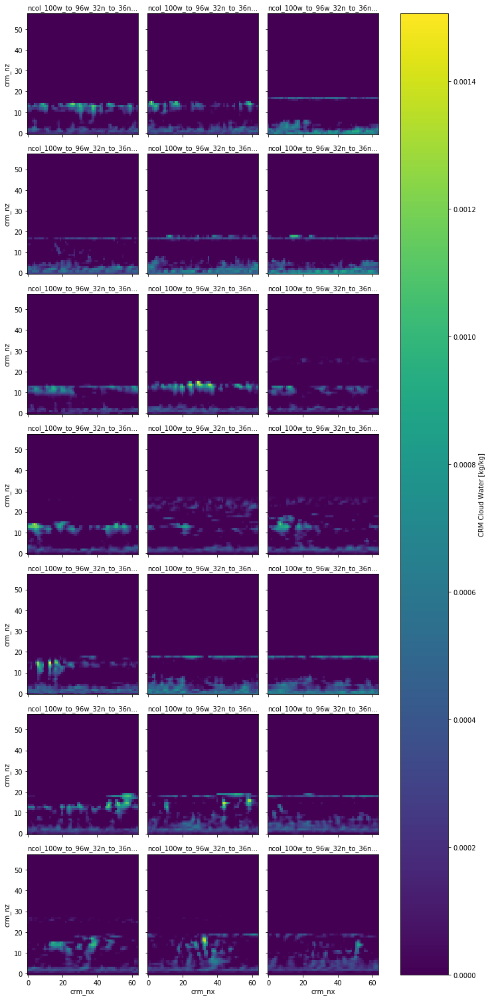

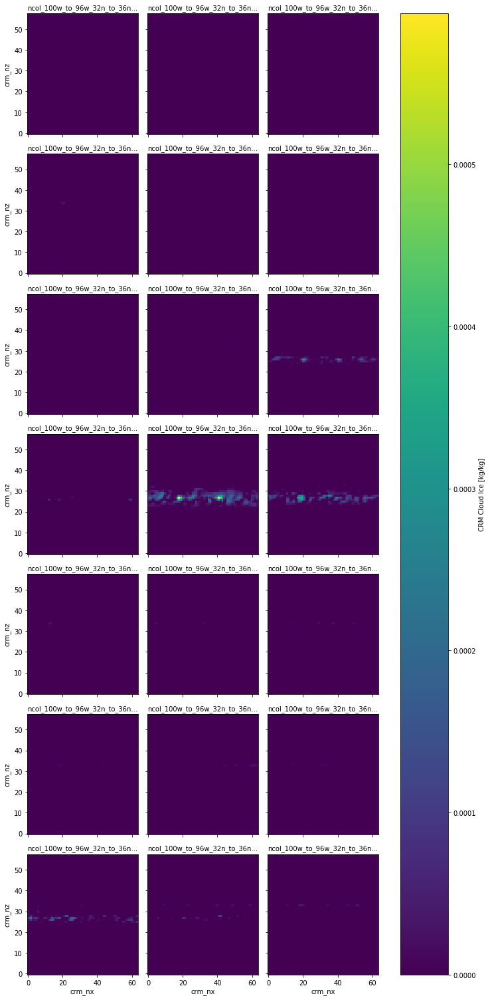

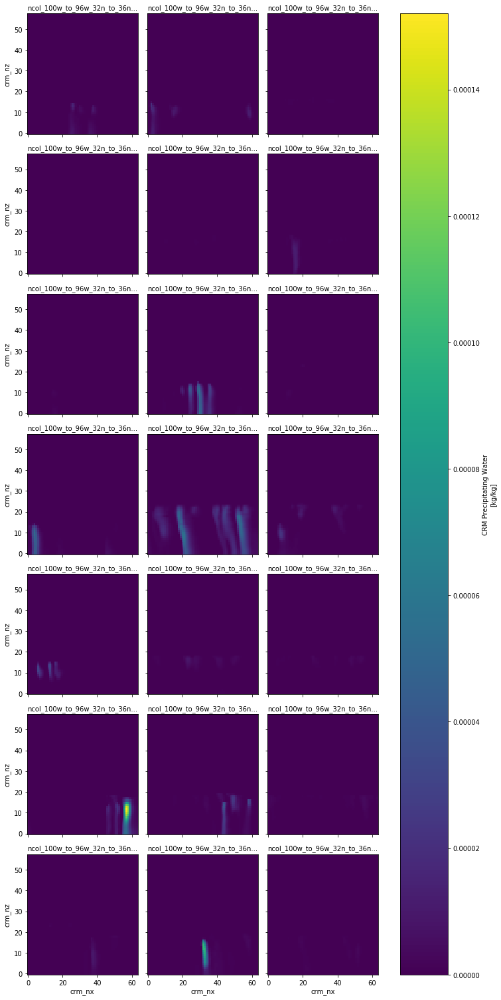

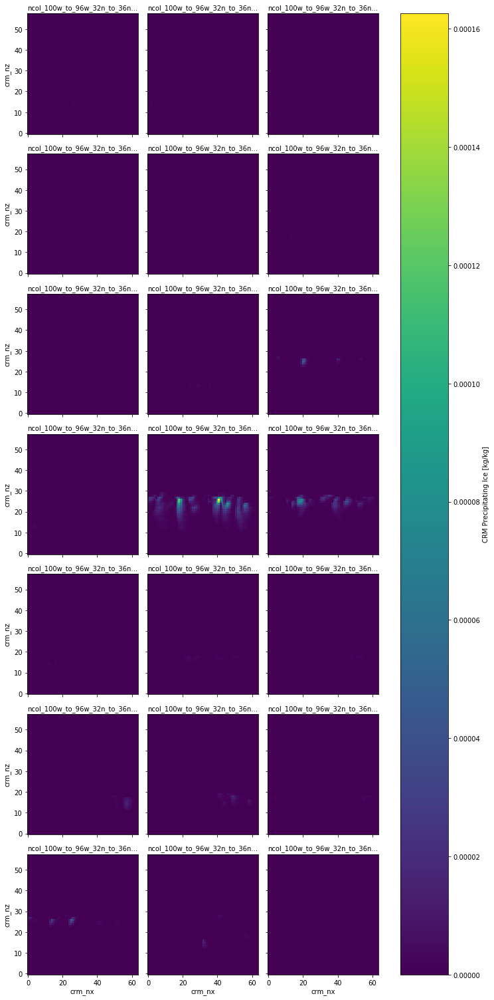

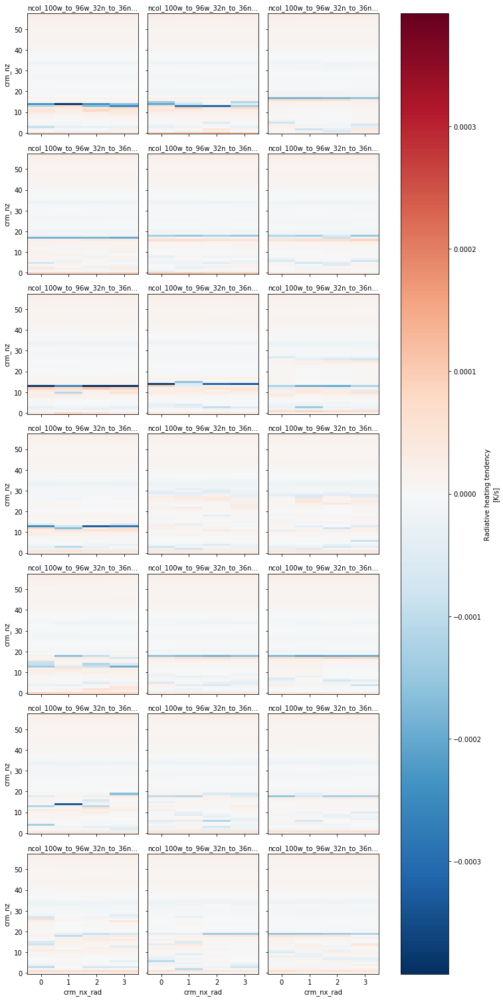

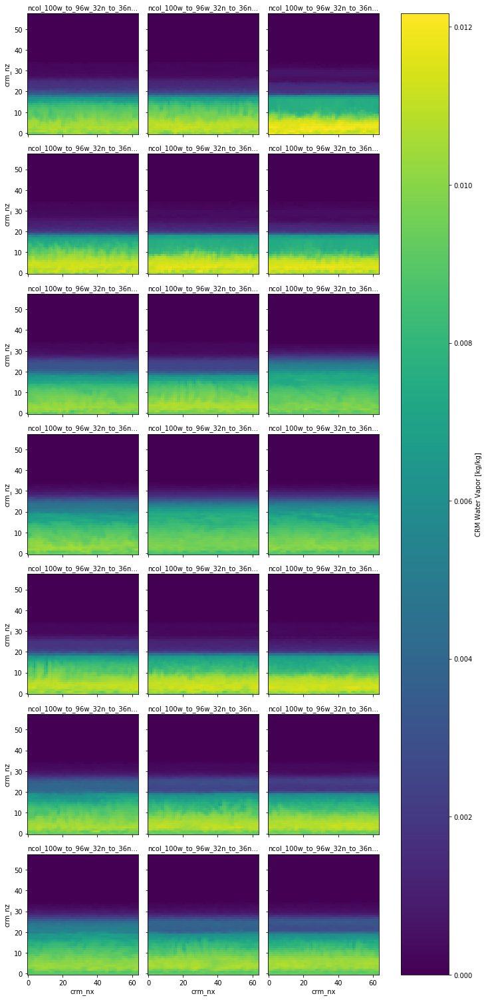

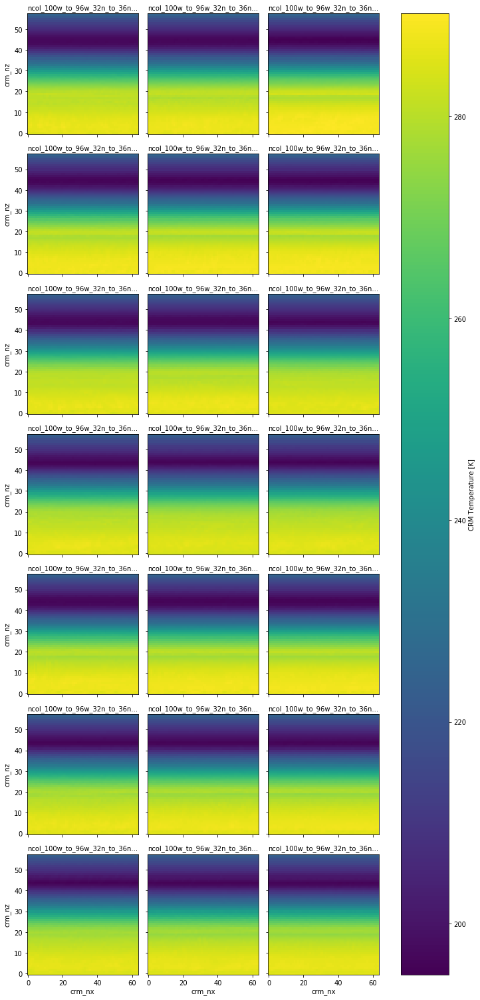

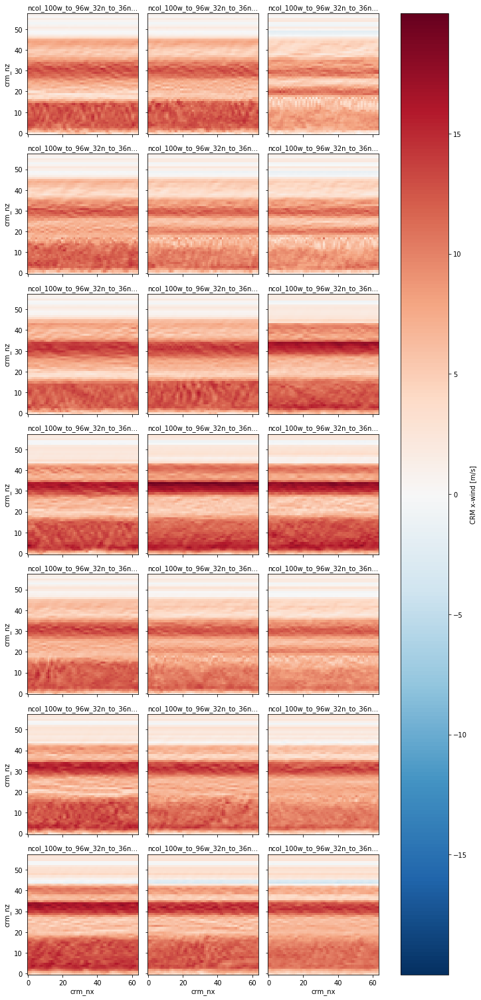

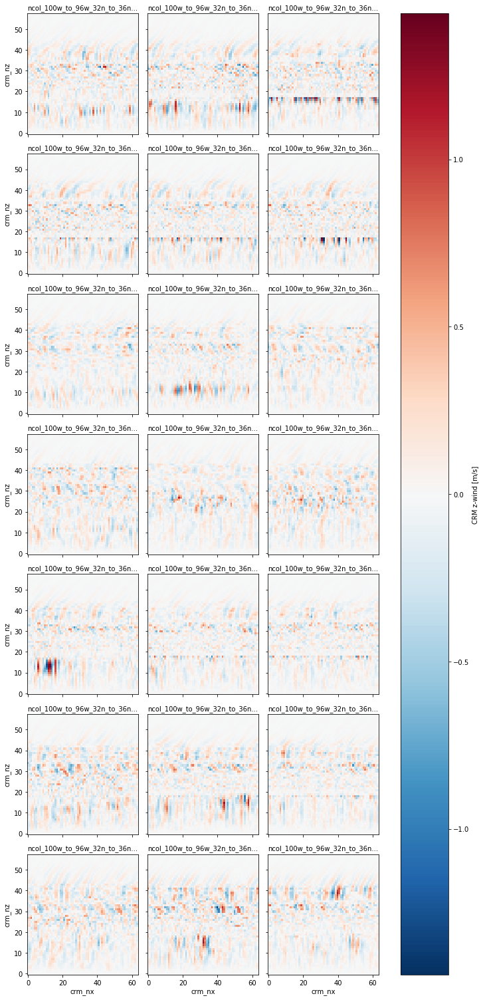

In [67]:
for v in varlist:
    if 'RAD' not in v:
        ds_crm[v].isel(time=91).plot(x='crm_nx', y='crm_nz', col='ncol_100w_to_96w_32n_to_36n', col_wrap=3);
    else:
        ds_crm[v].isel(time=91).plot(x='crm_nx_rad', y='crm_nz', col='ncol_100w_to_96w_32n_to_36n', col_wrap=3);

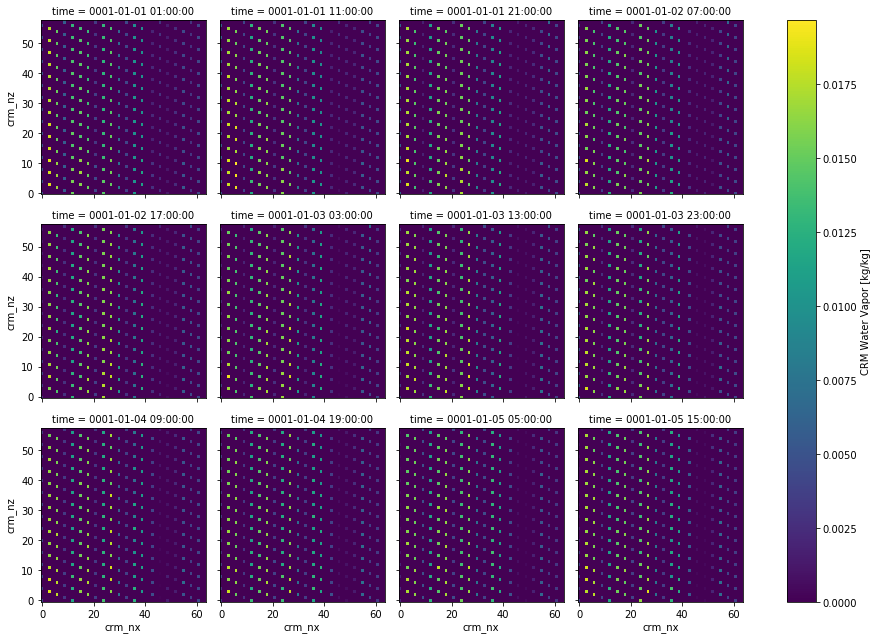

In [27]:
ds_crm['CRM_QV_97.8w_to_97.2w_36.27n_to_36.75n'].isel(**{'ncol_97.8w_to_97.2w_36.27n_to_36.75n': 3, 'time': slice(1, 121, 10)}).plot(x='crm_nx', y='crm_nz', col='time', col_wrap=4);

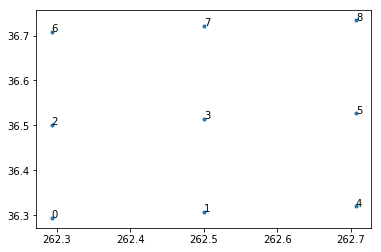

In [57]:
lat = ds_crm['lat_97.8w_to_97.2w_36.27n_to_36.75n'].values
lon = ds_crm['lon_97.8w_to_97.2w_36.27n_to_36.75n'].values
ncol = ds_crm['ncol_97.8w_to_97.2w_36.27n_to_36.75n'].values
plt.plot(lon, lat, '.')
for i in range(len(ncol)):
    plt.text(lon[i], lat[i], str(ncol[i]))

In [56]:
plt.text(lon, lat, [str(n) for n in ncol])

Text([262.2927051 262.5       262.2927051 262.5       262.7072949 262.7072949
 262.2927051 262.5       262.7072949], [36.29430571 36.30750896 36.50105272 36.51428547 36.32034998 36.52715517
 36.7078127  36.72107429 36.73397198], "['0', '1', '2', '3', '4', '5', '6', '7', '8']")

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x2aaae3497bf8> (for post_execute):


TypeError: only size-1 arrays can be converted to Python scalars

TypeError: only size-1 arrays can be converted to Python scalars

<Figure size 432x288 with 1 Axes>

In [10]:
ds2 = xr.open_dataset('/global/project/projectdirs/m3312/crjones/e3sm/ne120_sp_io_wishlist/run/ne120_sp_io_wishlist.cam.h1.0001-01-01-00000.nc')
ds2

<xarray.Dataset>
Dimensions:       (ilev: 73, lev: 72, nbnd: 2, ncol: 777602, time: 120)
Coordinates:
  * lev           (lev) float64 0.1238 0.1828 0.2699 ... 986.2 993.8 998.5
  * ilev          (ilev) float64 0.1 0.1477 0.218 0.3219 ... 990.5 997.0 1e+03
  * time          (time) object 0001-01-01 00:00:00 ... 0001-01-05 23:00:00
Dimensions without coordinates: nbnd, ncol
Data variables:
    lat           (ncol) float64 ...
    lon           (ncol) float64 ...
    area          (ncol) float64 ...
    hyam          (lev) float64 ...
    hybm          (lev) float64 ...
    P0            float64 ...
    hyai          (ilev) float64 ...
    hybi          (ilev) float64 ...
    date          (time) int32 ...
    datesec       (time) int32 ...
    time_bnds     (time, nbnd) float64 ...
    date_written  (time) |S8 ...
    time_written  (time) |S8 ...
    ndbase        int32 ...
    nsbase        int32 ...
    nbdate        int32 ...
    nbsec         int32 ...
    mdt           int32 ...
   

In [4]:
# (1/t_noio) + twrite ~ 1 / (t_io)
#   solve for twrite, and backout expected throughput from tsmall

t_noio = 0.528  # sypd 256x0.25 and no io
t_io = 0.375    # sypd 256x0.25 with io
twrite = 1/t_io - 1/t_noio
print(twrite)

tsmall = 1.05  # sypd 64x1 and no io
sypd_with_io = 1/(1/tsmall + twrite)
print(sypd_with_io)

0.7727272727272727
0.5796737766624843


In [58]:
ds2b = xr.open_dataset('/global/project/projectdirs/m3312/crjones/e3sm/ne120_sp_64x1_io/ne120_sp_64x1_io.cam.h1.0001-01-01-00000.nc');

(<xarray.DataArray 'PRECT' (ncol: 777602)>
 array([ 4.512782,  3.344123,  4.299287, ..., 12.598542,  8.622728, 13.125857])
 Dimensions without coordinates: ncol,
 <matplotlib.colorbar.Colorbar at 0x2aaaeafa5cc0>)

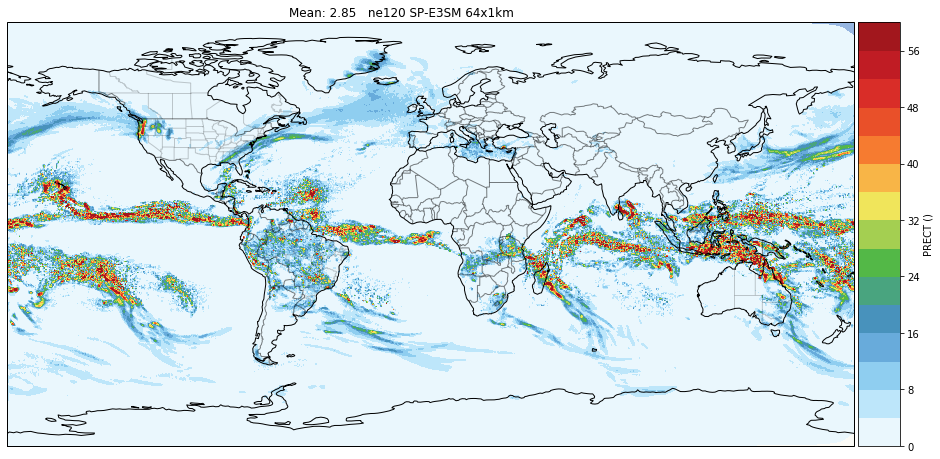

In [60]:
ese.plot_global('PRECT', ds2b.isel(time=slice(1, 120)), rescale=86400*1000, name='ne120 SP-E3SM 64x1km',
                cmap=cmclimate.cm.WhiteBlueGreenYellowRed, levels=range(0,64,4),
                figsize=(16, 12))

In [12]:
ds2a = xr.open_dataset('/global/project/projectdirs/m3312/crjones/e3sm/ne120_sp_64x1_io/run/ne120_sp_64x1_io.cam.h1.0001-01-01-00000.nc');

(<xarray.DataArray 'PRECT' (ncol: 777602)>
 array([ 3.564395,  2.665484,  4.248619, ..., 14.77382 , 10.433118, 14.067831])
 Dimensions without coordinates: ncol,
 <matplotlib.colorbar.Colorbar at 0x2aaae99ddc50>)

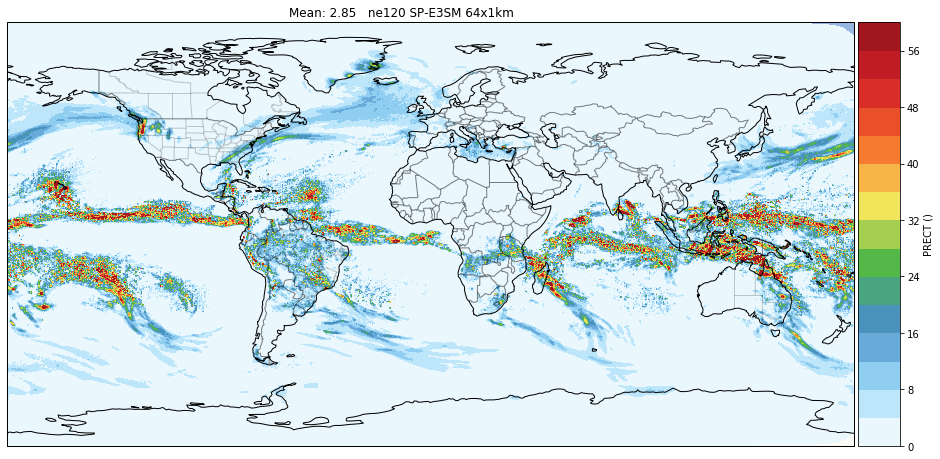

In [15]:
ese.plot_global('PRECT', ds2a, rescale=86400*1000, name='ne120 SP-E3SM 64x1km',
                cmap=cmclimate.cm.WhiteBlueGreenYellowRed, levels=range(0,64,4),
                figsize=(16, 12))

(<xarray.DataArray 'PRECT' (ncol: 777602)>
 array([ 1.477757,  2.033535,  2.973297, ..., 13.442954,  8.462806, 13.816195])
 Dimensions without coordinates: ncol,
 <matplotlib.colorbar.Colorbar at 0x2aaae9933780>)

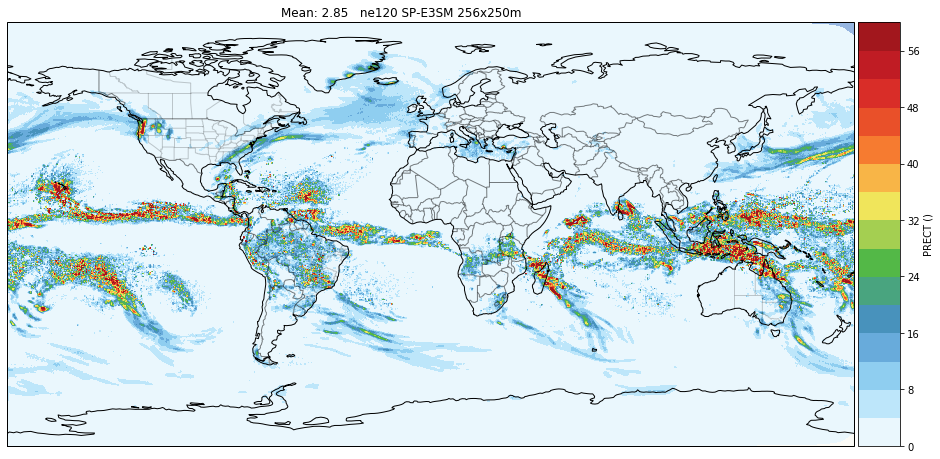

In [14]:
ese.plot_global('PRECT', ds2, rescale=86400*1000, name='ne120 SP-E3SM 256x250m', cmap=cmclimate.cm.WhiteBlueGreenYellowRed, levels=range(0,64,4),
                figsize=(16, 12))

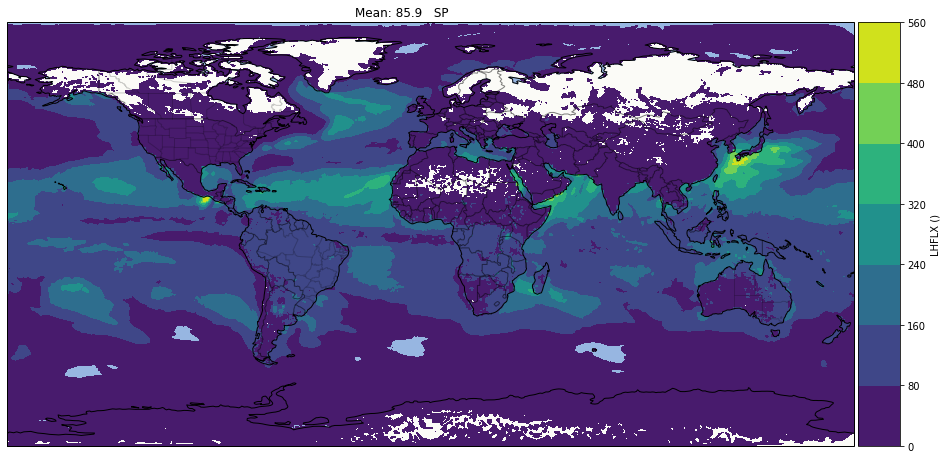

In [15]:
ese.plot_global('LHFLX', ds2, figsize=(16, 12), levels=range(0, 580, 80));

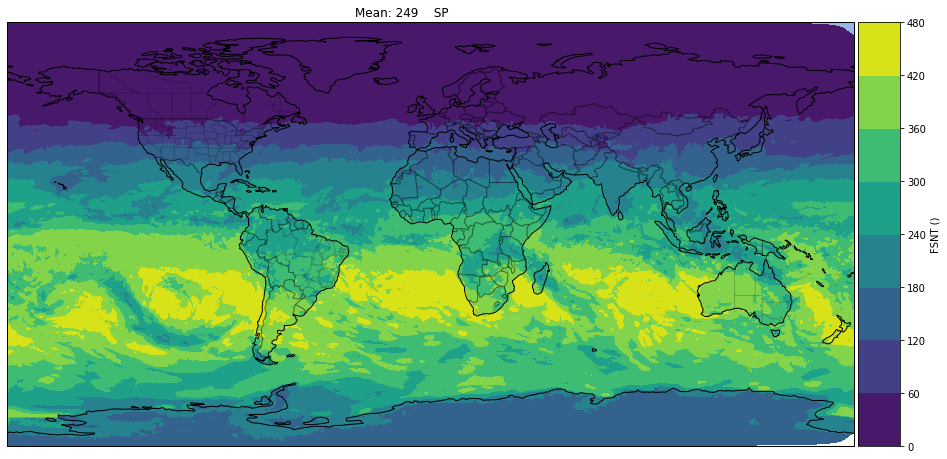

In [14]:
ese.plot_global('FSNT', ds2, figsize=(16, 12));

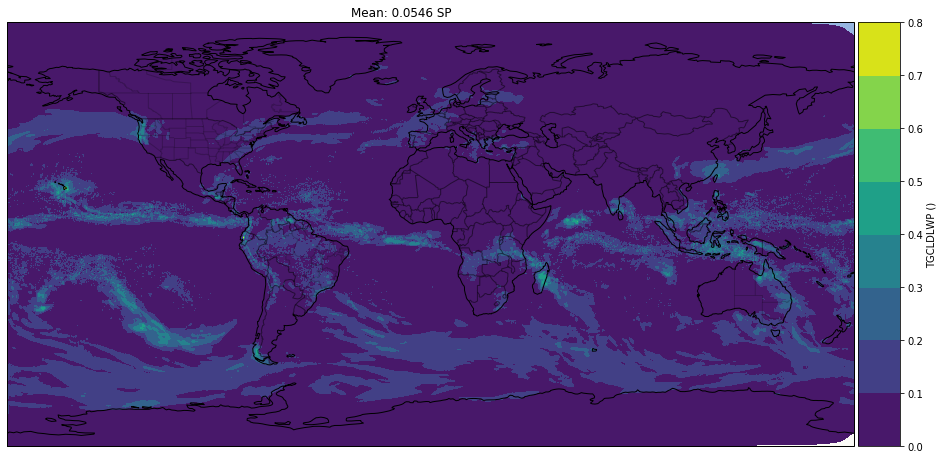

In [16]:
ese.plot_global('TGCLDLWP', ds2, figsize=(16, 12));

(<xarray.DataArray 'FLNT' (ncol: 777602)>
 array([253.32465, 255.1567 , 255.84235, ..., 213.01479, 216.48349, 216.70776],
       dtype=float32)
 Dimensions without coordinates: ncol,
 <matplotlib.colorbar.Colorbar at 0x2aaaea950780>)

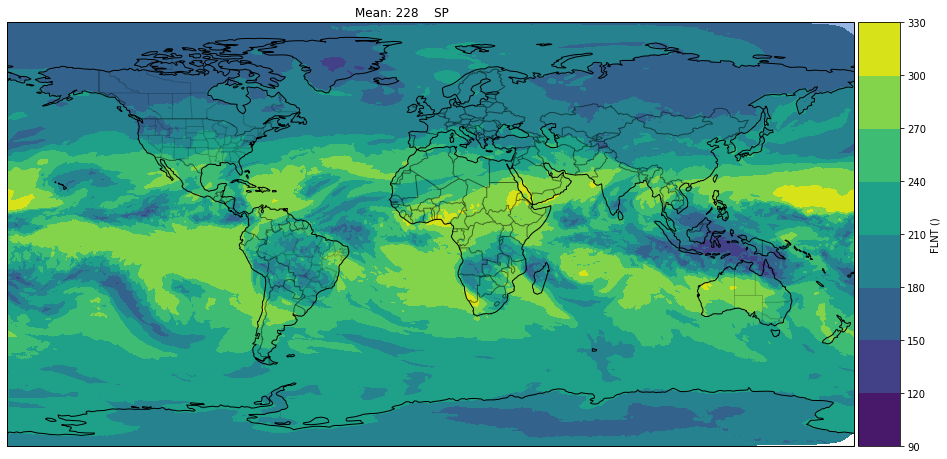

In [12]:
ese.plot_global('FLNT', ds2, figsize=(16, 12))

In [62]:
# quick look
case_ctl = 'ne30_sp1_gpu_cleanup_72L_64x1_1km'
case_exp = 'ne30_sp1_gpu_acc_postport_72L_64x1_1km'
base_dir = '/global/cscratch1/sd/crjones/acme_scratch/cori-knl'

s0 = '/'.join([base_dir, case_ctl, 'run', case_ctl])
s1 = '/'.join([base_dir, case_exp, 'run', case_exp])

# ctl
ds0_h1 = xr.open_dataset(s0 + '.cam.h1.1999-11-01-00000.nc')
ds0_h2 = xr.open_dataset(s0 + '.cam.h2.1999-11-01-00000.nc')

# test of gpu-code with crm_accel_factor = 5
ds1_h1 = xr.open_dataset(s1 + '.cam.h1.1999-11-01-00000.nc')
ds1_h2 = xr.open_dataset(s1 + '.cam.h2.1999-11-01-00000.nc')

ds2_h1 = xr.open_dataset('/global/project/projectdirs/m3312/crjones/e3sm/ne30_test_accel/accel_turned_off/ne30_test_accel.cam.h1.1999-11-01-00000.nc')
ds2_h2 = xr.open_dataset('/global/project/projectdirs/m3312/crjones/e3sm/ne30_test_accel/accel_turned_off/ne30_test_accel.cam.h2.1999-11-01-00000.nc')

# ds0_h2 = xr.open_dataset('/global/cscratch1/sd/crjones/acme_scratch/cori-knl/ne30_sp1_accel_uv_a5_72L_64x1_1km/run/ne30_sp1_accel_uv_a5_72L_64x1_1km.cam.h2.1999-11-01-00000.nc')

# test of gpu-code with crm_accel_factor = 5 on CPU
# ds1_h1 = xr.open_dataset('/global/cscratch1/sd/crjones/acme_scratch/cori-knl/ne30_sp1_accel_update_72L_64x1_1km/run/ne30_sp1_accel_update_72L_64x1_1km.cam.h1.1999-11-01-00000.nc')
# ds1_h2 = xr.open_dataset('/global/cscratch1/sd/crjones/acme_scratch/cori-knl/ne30_sp1_accel_update_72L_64x1_1km/run/ne30_sp1_accel_update_72L_64x1_1km.cam.h2.1999-11-01-00000.nc')

# ds2 = xr.open_dataset('/global/cscratch1/sd/crjones/acme_scratch/cori-knl/ne30_sp1_accel_uv_new_72L_64x1_1km/run/ne30_sp1_accel_uv_new_72L_64x1_1km.cam.h2.1999-11-01-00000.nc')
# ds2 = xr.open_mfdataset('/global/cscratch1/sd/crjones/acme_scratch/cori-knl/ne30_sp1_accel_uv_a5_72L_64x1_1km/run/ne30_sp1_accel_uv_a5_72L_64x1_1km.cam.h0.1999-11.nc')

In [36]:
ds.attrs

OrderedDict([('ne', 30),
             ('np', 4),
             ('Conventions', 'CF-1.0'),
             ('source', 'CAM'),
             ('case', 'ne30_sp1_sgs_fix_72L_64x1_1km'),
             ('title', 'UNSET'),
             ('logname', 'crjones'),
             ('host', 'cori11'),
             ('Version', '$Name$'),
             ('revision_Id', '$Id$'),
             ('initial_file',
              '/project/projectdirs/acme/inputdata/atm/cam/inic/homme/cami_mam3_Linoz_ne30np4_L72_c160214.nc'),
             ('topography_file',
              '/project/projectdirs/acme/inputdata/atm/cam/topo/USGS-gtopo30_ne30np4_16xdel2-PFC-consistentSGH.nc'),
             ('time_period_freq', 'hour_6')])

In [37]:
dsx.attrs

OrderedDict([('ne', 30),
             ('np', 4),
             ('Conventions', 'CF-1.0'),
             ('source', 'CAM'),
             ('case', 'ne30_sp1_accel_uv_a5_72L_64x1_1km'),
             ('title', 'UNSET'),
             ('logname', 'crjones'),
             ('host', 'cori12'),
             ('Version', '$Name$'),
             ('revision_Id', '$Id$'),
             ('initial_file',
              '/project/projectdirs/acme/inputdata/atm/cam/inic/homme/cami_mam3_Linoz_ne30np4_L72_c160214.nc'),
             ('topography_file',
              '/project/projectdirs/acme/inputdata/atm/cam/topo/USGS-gtopo30_ne30np4_16xdel2-PFC-consistentSGH.nc'),
             ('time_period_freq', 'day_1')])

In [7]:
ds = xr.open_dataset('/global/project/projectdirs/m3312/crjones/e3sm/ne30_sp1_sgs_fix_72L_64x1_1km/ne30_sp1_sgs_fix_72L_64x1_1km.cam.h1.1999-11-01-00000.nc')
dsx= xr.open_dataset('/global/project/projectdirs/m3312/crjones/e3sm/ne30_sp1_accel_uv_a5_72L_64x1_1km/ne30_sp1_accel_uv_a5_72L_64x1_1km.cam.h2.1999-11-01-00000.nc')
dsx.FSNT.attrs

OrderedDict([('Sampling_Sequence', 'rad_lwsw'),
             ('units', 'W/m2'),
             ('long_name', 'Net solar flux at top of model'),
             ('cell_methods', 'time: mean')])

In [45]:
vars_to_compare = [v for v in ds if v in dsx and v.upper() == v]
print(vars_to_compare)

['P0', 'FLNS', 'FLNT', 'FLUT', 'FSNS', 'FSNT', 'LHFLX', 'LWCF', 'PS', 'QAP', 'SHFLX', 'SWCF', 'TAP', 'TS']


In [40]:
dsx

<xarray.Dataset>
Dimensions:       (ilev: 73, lev: 72, nbnd: 2, ncol: 48602, time: 30)
Coordinates:
  * lev           (lev) float64 0.1238 0.1828 0.2699 ... 986.2 993.8 998.5
  * ilev          (ilev) float64 0.1 0.1477 0.218 0.3219 ... 990.5 997.0 1e+03
  * time          (time) object 1999-11-01 00:00:00 ... 1999-11-30 00:00:00
Dimensions without coordinates: nbnd, ncol
Data variables:
    lat           (ncol) float64 ...
    lon           (ncol) float64 ...
    area          (ncol) float64 4.397e-05 0.0001465 ... 0.0003665 0.0003665
    hyam          (lev) float64 ...
    hybm          (lev) float64 ...
    P0            float64 ...
    hyai          (ilev) float64 ...
    hybi          (ilev) float64 ...
    date          (time) int32 ...
    datesec       (time) int32 ...
    time_bnds     (time, nbnd) float64 ...
    date_written  (time) |S8 ...
    time_written  (time) |S8 ...
    ndbase        int32 ...
    nsbase        int32 ...
    nbdate        int32 ...
    nbsec         int

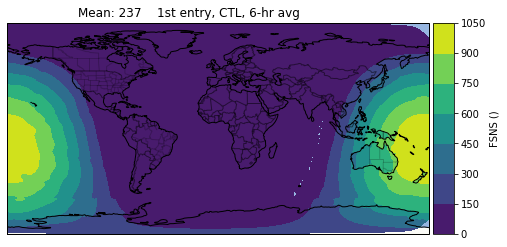

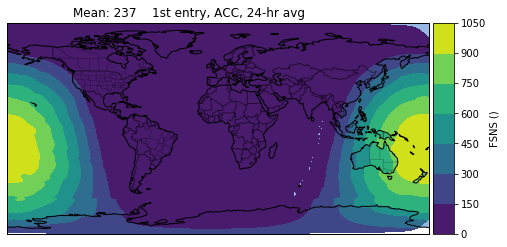

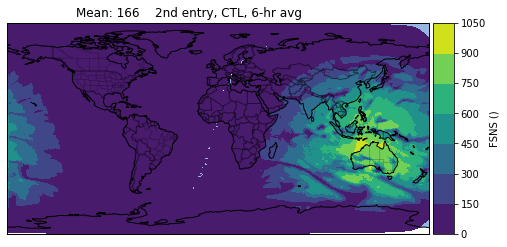

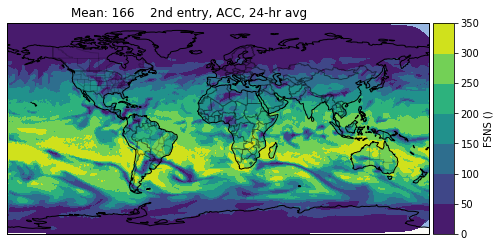

In [48]:
v = 'FSNS'
ese.plot_global(v, ds.isel(time=0), name='1st entry, CTL, 6-hr avg');
ese.plot_global(v, dsx.isel(time=0), name='1st entry, ACC, 24-hr avg');
ese.plot_global(v, ds.isel(time=1), name='2nd entry, CTL, 6-hr avg');
ese.plot_global(v, dsx.isel(time=1), name='2nd entry, ACC, 24-hr avg');

In [55]:
ds.time.attrs

OrderedDict([('long_name', 'time'), ('bounds', 'time_bnds')])

In [54]:
ds.time_bnds

<xarray.DataArray 'time_bnds' (time: 24, nbnd: 2)>
array([[0.  , 0.  ],
       [0.  , 0.25],
       [0.25, 0.5 ],
       [0.5 , 0.75],
       [0.75, 1.  ],
       [1.  , 1.25],
       [1.25, 1.5 ],
       [1.5 , 1.75],
       [1.75, 2.  ],
       [2.  , 2.25],
       [2.25, 2.5 ],
       [2.5 , 2.75],
       [2.75, 3.  ],
       [3.  , 3.25],
       [3.25, 3.5 ],
       [3.5 , 3.75],
       [3.75, 4.  ],
       [4.  , 4.25],
       [4.25, 4.5 ],
       [4.5 , 4.75],
       [4.75, 5.  ],
       [5.  , 5.25],
       [5.25, 5.5 ],
       [5.5 , 5.75]])
Coordinates:
  * time     (time) object 1999-11-01 00:00:00 ... 1999-11-06 18:00:00
Dimensions without coordinates: nbnd
Attributes:
    long_name:  time interval endpoints

In [53]:
dsx.time_bnds

<xarray.DataArray 'time_bnds' (time: 30, nbnd: 2)>
array([[ 0.,  0.],
       [ 0.,  1.],
       [ 1.,  2.],
       [ 2.,  3.],
       [ 3.,  4.],
       [ 4.,  5.],
       [ 5.,  6.],
       [ 6.,  7.],
       [ 7.,  8.],
       [ 8.,  9.],
       [ 9., 10.],
       [10., 11.],
       [11., 12.],
       [12., 13.],
       [13., 14.],
       [14., 15.],
       [15., 16.],
       [16., 17.],
       [17., 18.],
       [18., 19.],
       [19., 20.],
       [20., 21.],
       [21., 22.],
       [22., 23.],
       [23., 24.],
       [24., 25.],
       [25., 26.],
       [26., 27.],
       [27., 28.],
       [28., 29.]])
Coordinates:
  * time     (time) object 1999-11-01 00:00:00 ... 1999-11-30 00:00:00
Dimensions without coordinates: nbnd
Attributes:
    long_name:  time interval endpoints

In [8]:
dsx1 = dsx.sel(time='1999-11-03')

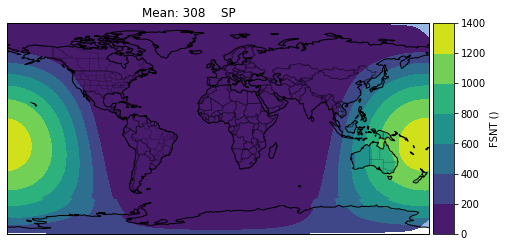

In [31]:
ese.plot_global('FSNT', ds.isel(time=0));

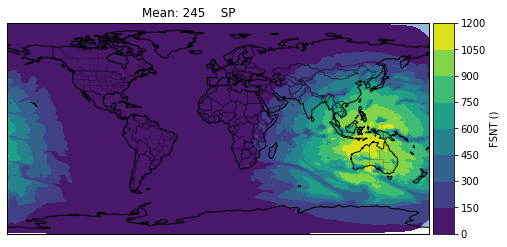

In [32]:
ese.plot_global('FSNT', ds.isel(time=1));

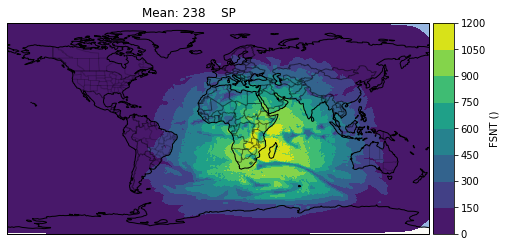

In [34]:
ese.plot_global('FSNT', ds.isel(time=2));

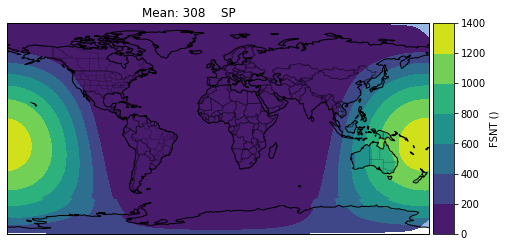

In [24]:
ese.plot_global('FSNT', ds.isel(time=0));

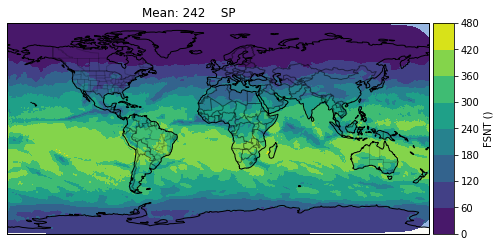

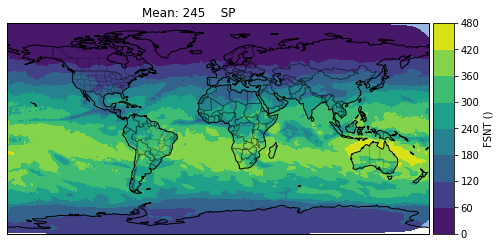

In [28]:
ese.plot_global('FSNT', ds, time_slice=slice('1999-11-02', '1999-11-05'));
ese.plot_global('FSNT', ds, time_slice=slice('1999-11-01', '1999-11-05'));

In [31]:
dsx = xr.open_dataset('/global/cscratch1/sd/crjones/acme_scratch/cori-knl/ne30_sp1_gpu_acc_ctl_72L_64x1_1km/run/ne30_sp1_gpu_acc_ctl_72L_64x1_1km.cam.rhh1.1999-11-01-00000.nc')

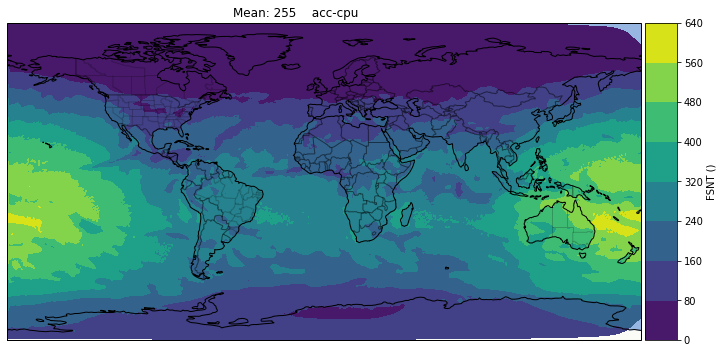

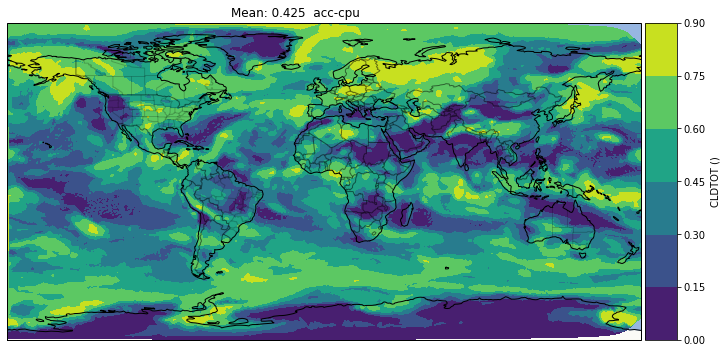

In [67]:
for v in ['FSNT', 'CLDTOT']:
    ese.plot_global(v, dsx, time_slice=tslice, name='acc-cpu', figsize=(12, 8))

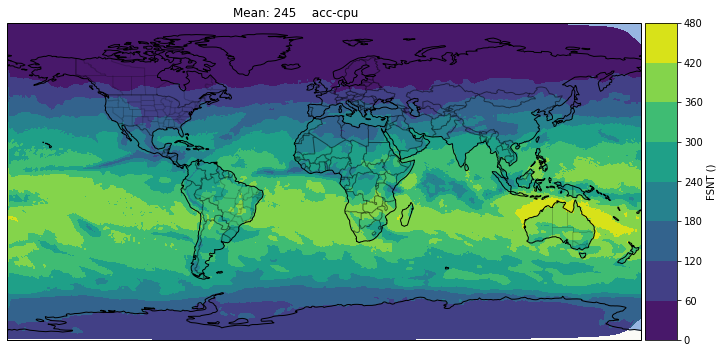

In [68]:
for v in ['FSNT']:
    ese.plot_global(v, ds, time_slice=tslice, name='acc-cpu', figsize=(12, 8))

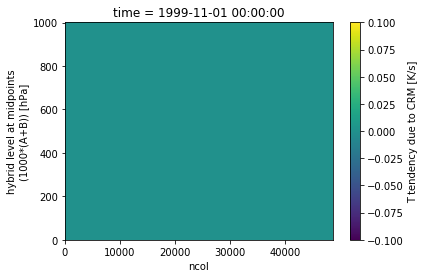

In [36]:
dsx['SPDT'].plot()

In [25]:
ds2_h1.time

<xarray.DataArray 'time' (time: 6)>
array([cftime.DatetimeNoLeap(1, 1, 1, 0, 0, 0, 0, 1, 1),
       cftime.DatetimeNoLeap(1, 1, 2, 0, 0, 0, 0, 2, 2),
       cftime.DatetimeNoLeap(1, 1, 3, 0, 0, 0, 0, 3, 3),
       cftime.DatetimeNoLeap(1, 1, 4, 0, 0, 0, 0, 4, 4),
       cftime.DatetimeNoLeap(1, 1, 5, 0, 0, 0, 0, 5, 5),
       cftime.DatetimeNoLeap(1, 1, 6, 0, 0, 0, 0, 6, 6)], dtype=object)
Coordinates:
  * time     (time) object 0001-01-01 00:00:00 ... 0001-01-06 00:00:00
Attributes:
    long_name:  time
    bounds:     time_bnds

In [64]:
tmax = '1999-11-6'
tmin = '1999-11-01'

tmax2 = tmax
tmin2 = tmin
print(tmin, tmax)

1999-11-01 1999-11-6


In [49]:
variables_to_plot = [v for v in ds1_h2 if 'ncol' in ds1_h2[v].dims and len(ds1_h2[v].dims) == 2 and v not in ['lat', 'lon', 'area']]

In [50]:
print(variables_to_plot)

['CLDHGH', 'CLDLOW', 'CLDMED', 'CLDTOT', 'FLNS', 'FLNT', 'FLUT', 'FSNS', 'FSNT', 'LHFLX', 'LWCF', 'OMEGA500', 'PRECC', 'PRECL', 'PRECT', 'PS', 'PSL', 'SHFLX', 'SWCF', 'TMQ', 'TREFHT', 'TS', 'U200', 'U850', 'V200', 'V850']


In [51]:
tslice = slice(tmin, tmax)
tslice2 = slice(tmin2, tmax2)

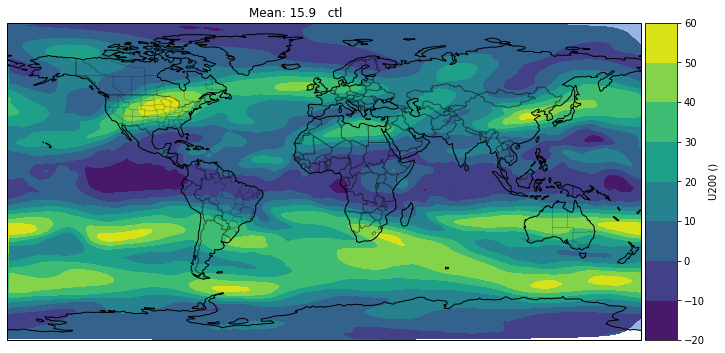

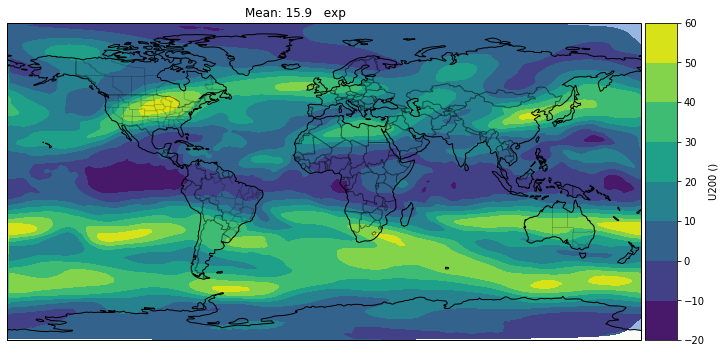

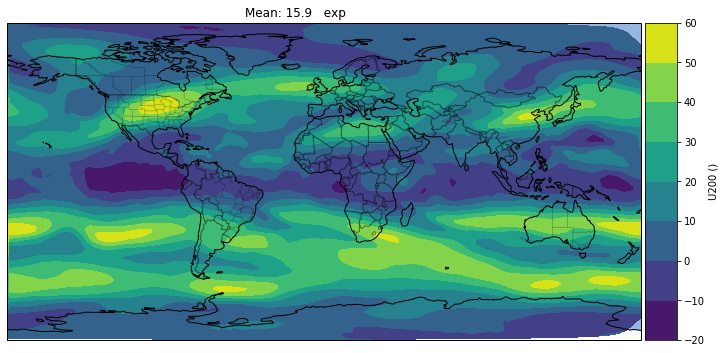

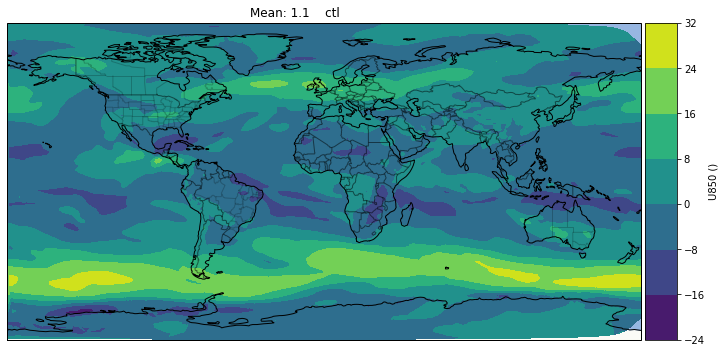

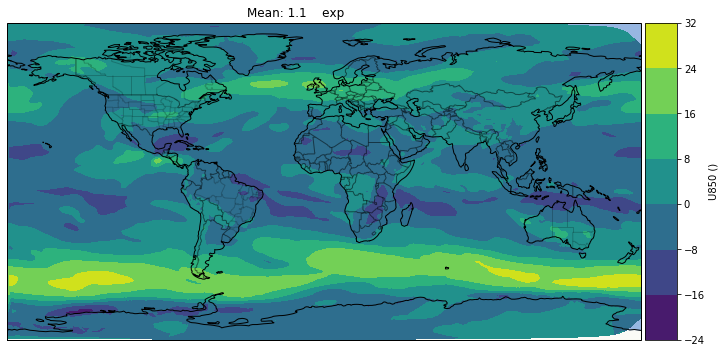

...

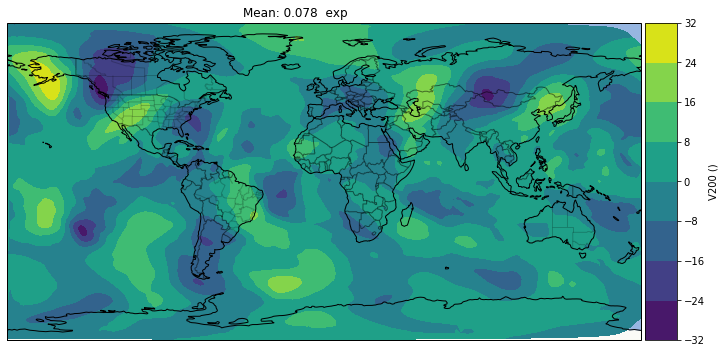

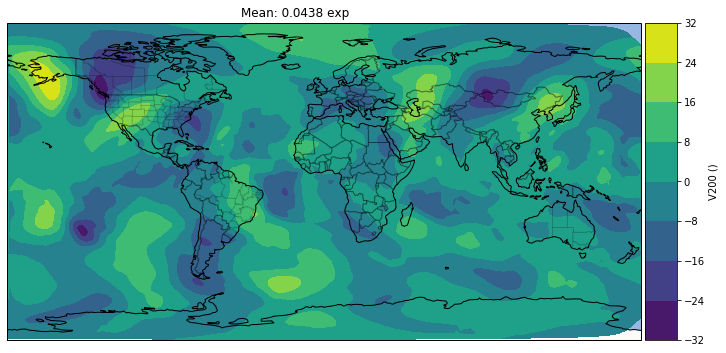

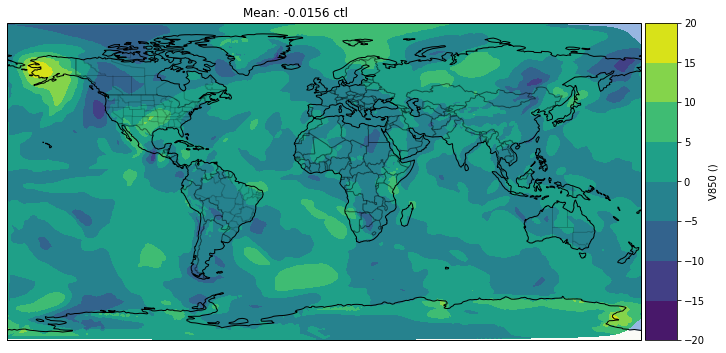

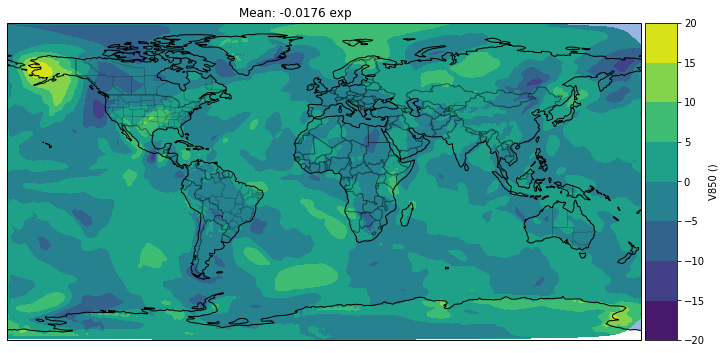

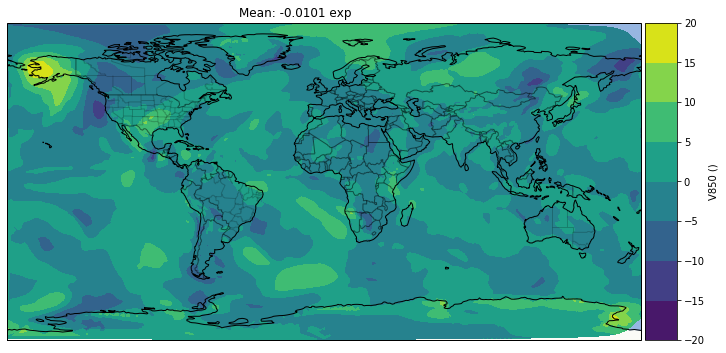

In [52]:
# levels = {'FLNS': range(0, 180, 20), 'FLNT': range()}
for v in ['U200', 'U850', 'V200', 'V850']:
    ese.plot_global(v, ds0_h2, time_slice=tslice, name='ctl', figsize=(12, 8))
    ese.plot_global(v, ds1_h2, time_slice=tslice, name='exp', figsize=(12, 8))
    ese.plot_global(v, ds2_h2, time_slice=tslice2, name='gpu-exp', figsize=(12, 8))

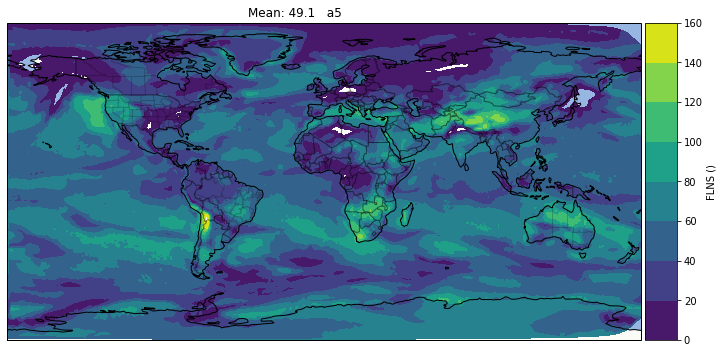

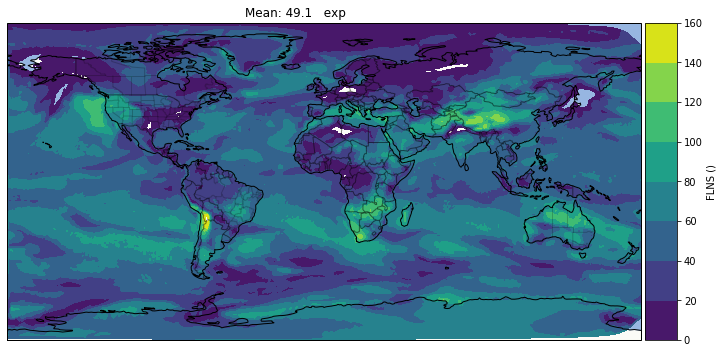

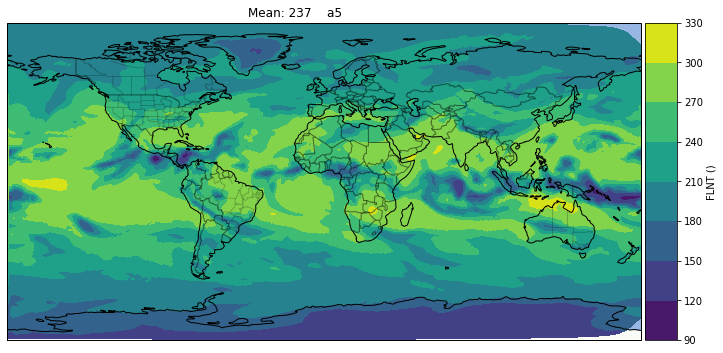

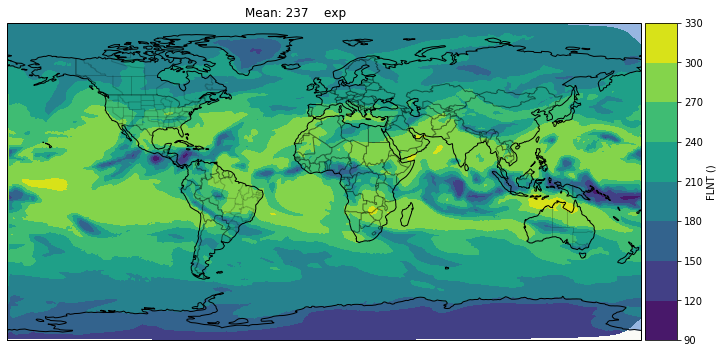

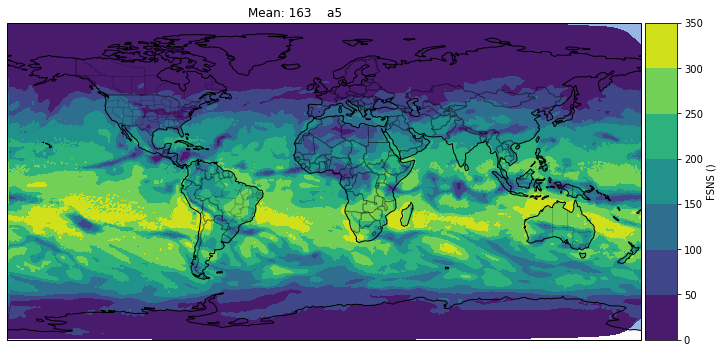

...

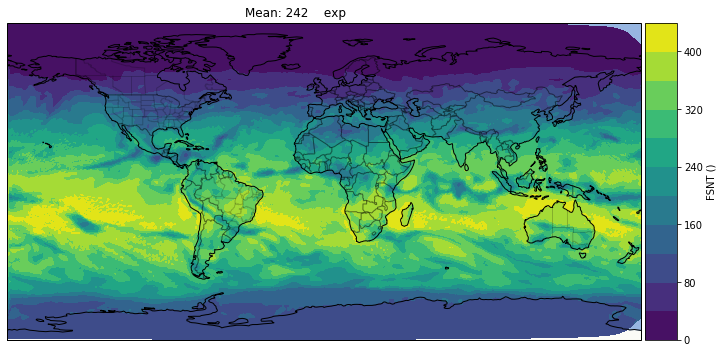

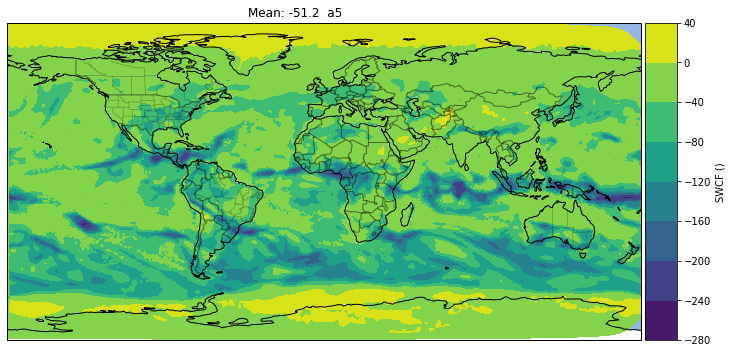

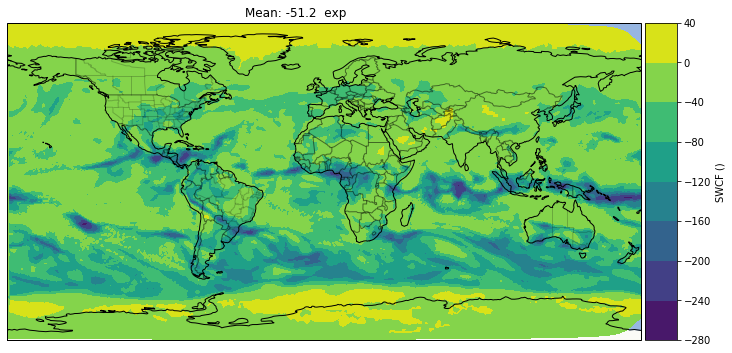

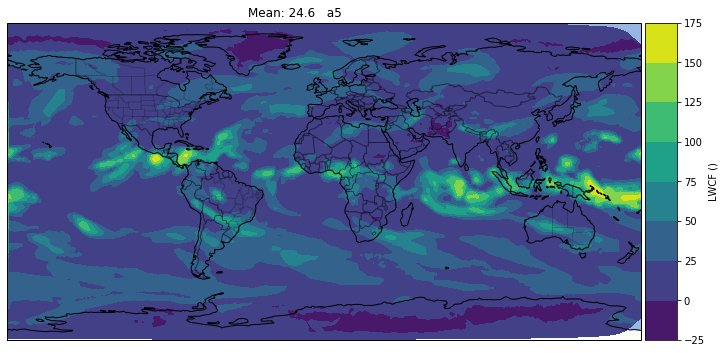

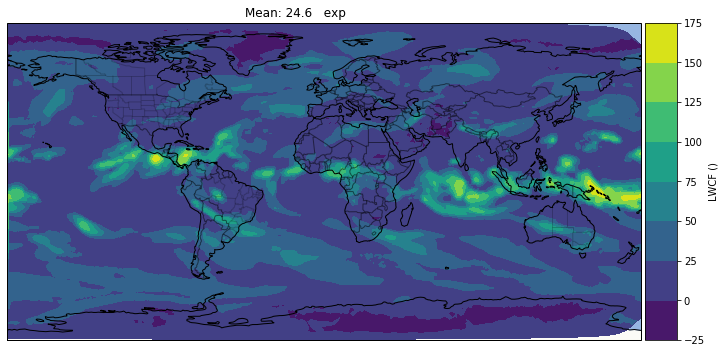

In [65]:
levels = {'FLNS': range(0, 180, 20), 'FSNT': range(0, 480, 40)}
for v in ['FLNS', 'FLNT', 'FSNS', 'FSNT', 'SWCF', 'LWCF']:
    kwargs = dict()
    if v in levels:
        kwargs = {'levels': levels[v]}
    # ese.plot_global(v, ds, time_slice=tslice, name='real-ctl', figsize=(12, 8), **kwargs)
    ese.plot_global(v, ds0_h2, time_slice=tslice, name='a5', figsize=(12, 8), **kwargs)
    ese.plot_global(v, ds1_h2, time_slice=tslice, name='exp', figsize=(12, 8), **kwargs)
    # ese.plot_global(v, ds2_h2, time_slice=tslice, name='gpu-ctl', figsize=(12, 8), **kwargs)

In [58]:
for v in ['CLDTOT', 'CLDMED', 'CLDLOW', 'CLDHGH']:
    ese.plot_global(v, ds, time_slice=tslice, name='real-ctl', figsize=(12, 8), levels=np.arange(0, 1, 0.1))
    ese.plot_global(v, ds0_h2, time_slice=tslice, name='ctl', figsize=(12, 8), levels=np.arange(0, 1, 0.1))
    ese.plot_global(v, ds1_h2, time_slice=tslice, name='exp', figsize=(12, 8), levels=np.arange(0, 1, 0.1))
    ese.plot_global(v, ds2_h2, time_slice=tslice, name='exp', figsize=(12, 8), levels=np.arange(0, 1, 0.1))

KeyError: 'CLDTOT'

In [ ]:
for v in variables_to_plot:
    ese.plot_global(v, ds0_h2, time_slice=tslice, name='ctl', figsize=(16, 12))
    ese.plot_global(v, ds1_h2, time_slice=tslice, name='ctl', figsize=(16, 12))

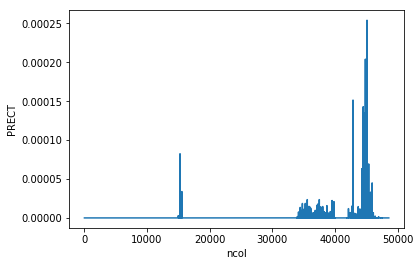

In [37]:
(ds2_h2['PRECT'] * 86400 * 1000).mean(dim='time').plot()

In [63]:
tslice = slice('1999-11-02', '1999-11-04')

"\nese.plot_global('PRECT', ds2_h2, time_slice=slice('1999-11-01','1999-11-05'), name='gpu-exp', levels=range(0,20,2),\n                rescale=86400*1000, cmap=cmclimate.cm.WhiteBlueGreenYellowRed, \n                figsize=(16, 12));\n"

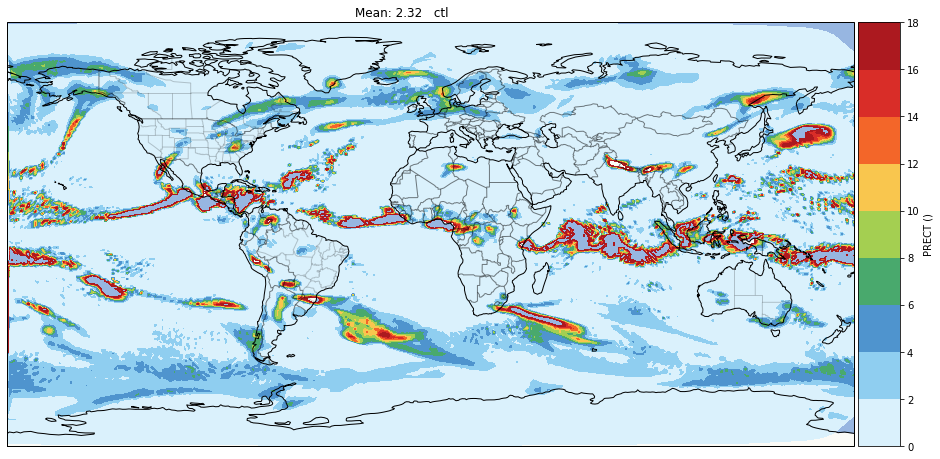

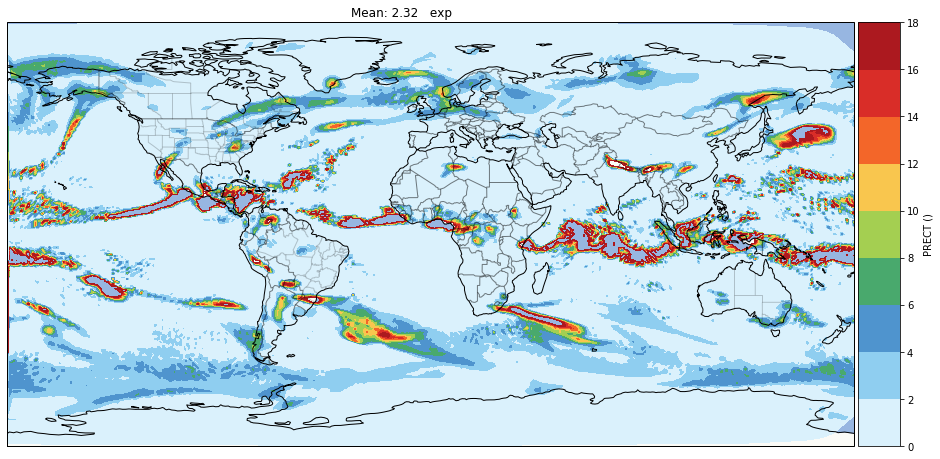

In [64]:
ese.plot_global('PRECT', ds0_h2, time_slice=tslice, name='ctl',
                rescale=86400*1000, cmap=cmclimate.cm.WhiteBlueGreenYellowRed, levels=range(0,20,2),
                figsize=(16, 12));

ese.plot_global('PRECT', ds1_h2, time_slice=tslice, name='exp',
                rescale=86400*1000, cmap=cmclimate.cm.WhiteBlueGreenYellowRed, levels=range(0,20,2),
                figsize=(16, 12));
"""
ese.plot_global('PRECT', ds2_h2, time_slice=slice('1999-11-01','1999-11-05'), name='gpu-exp', levels=range(0,20,2),
                rescale=86400*1000, cmap=cmclimate.cm.WhiteBlueGreenYellowRed, 
                figsize=(16, 12));
"""

In [ ]:
ds_delta = ds0_h2.copy()
for v in variables_to_plot:
    ds_delta[v] = ds0_h2[v] - ds1_h2[v]

In [14]:
rad_vars = [v for v in all_map_vars if v[0] == 'F']
print(rad_vars)

['FLDS', 'FLNS', 'FLNSC', 'FLNT', 'FLNTC', 'FLUT', 'FLUTC', 'FSDS', 'FSDSC', 'FSNS', 'FSNSC', 'FSNT', 'FSNTC', 'FSNTOA', 'FSNTOAC', 'FSUTOA', 'FSUTOAC']


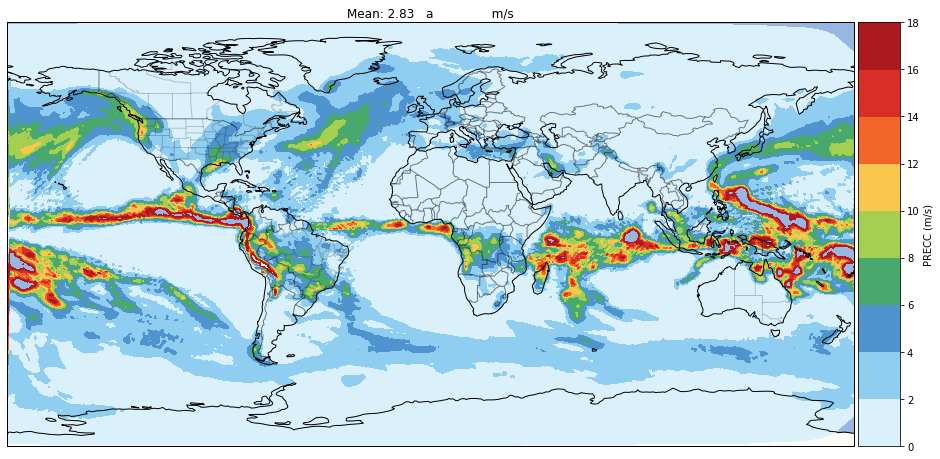

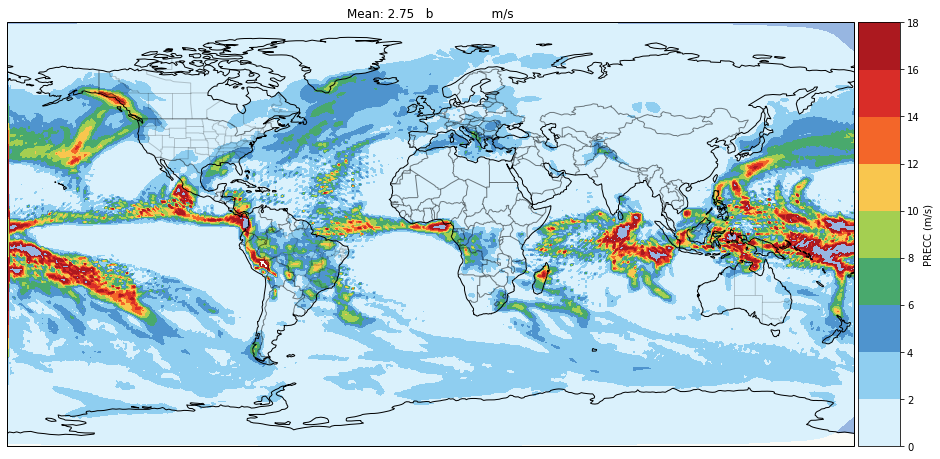

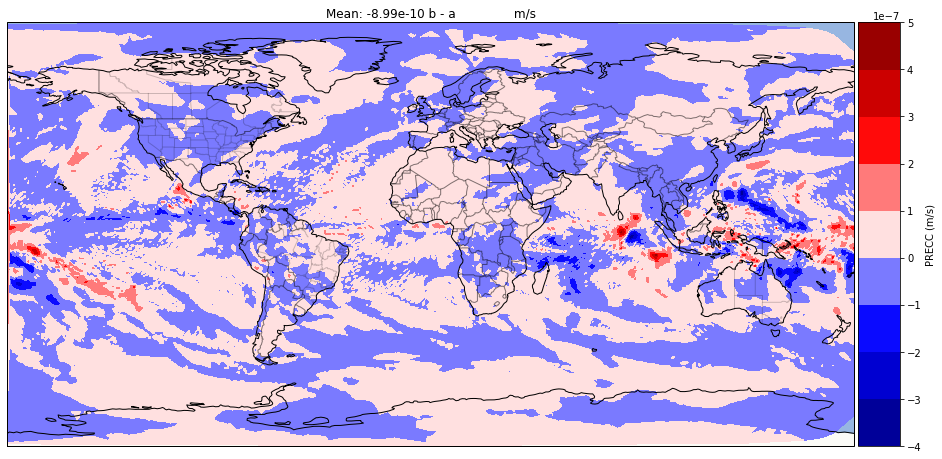

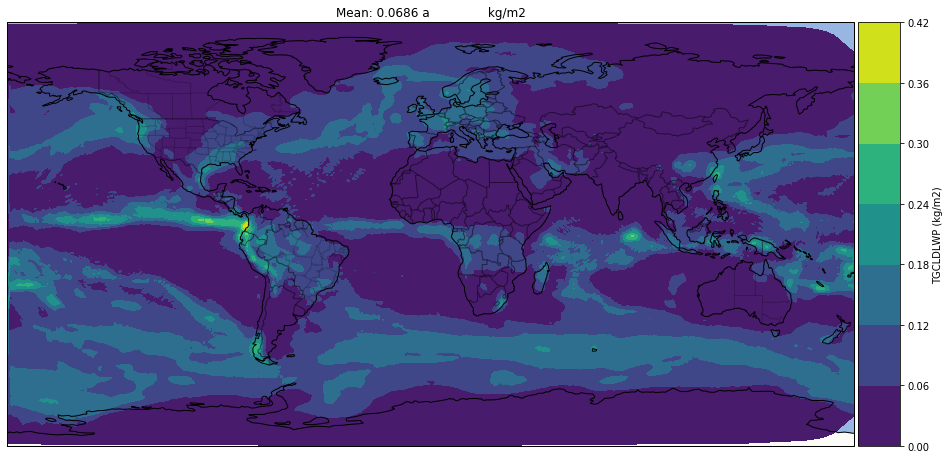

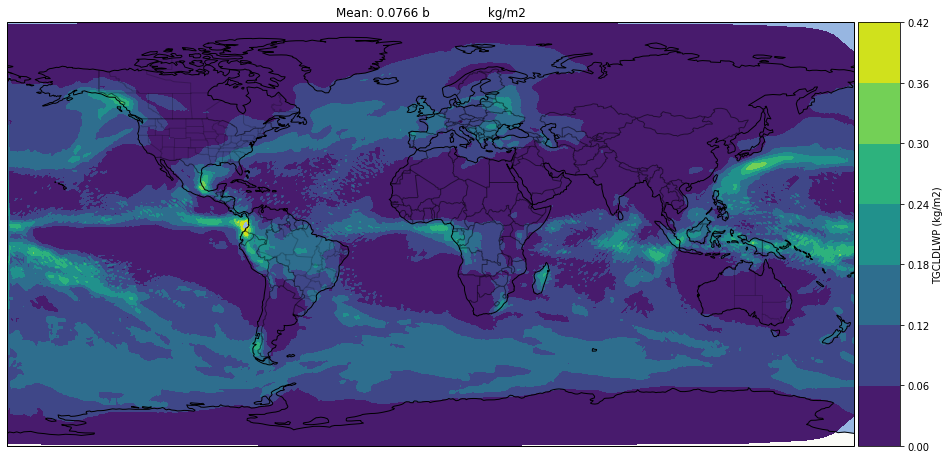

...

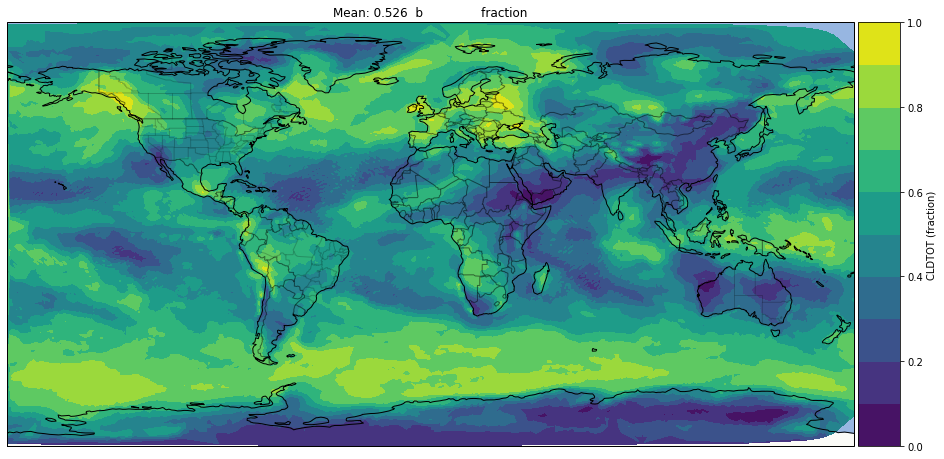

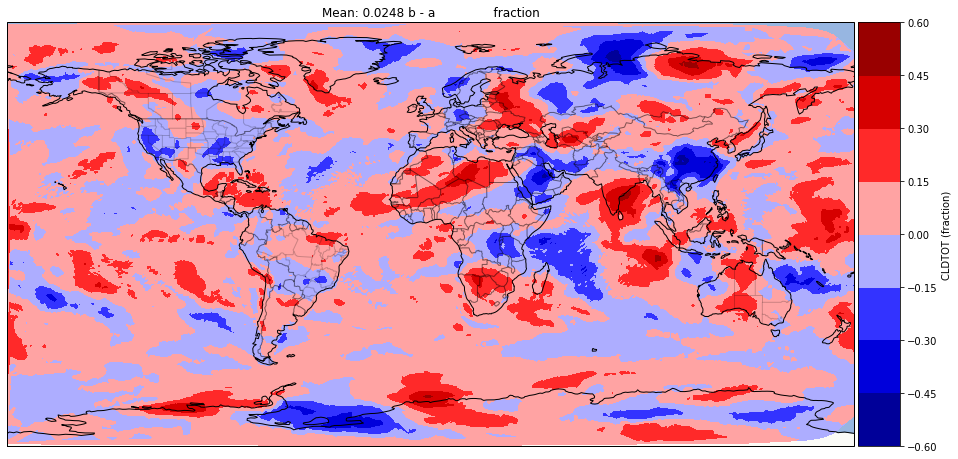

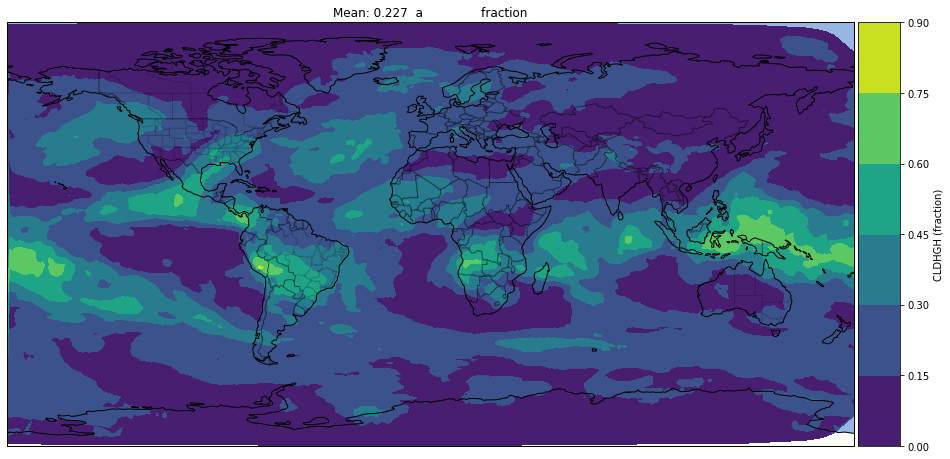

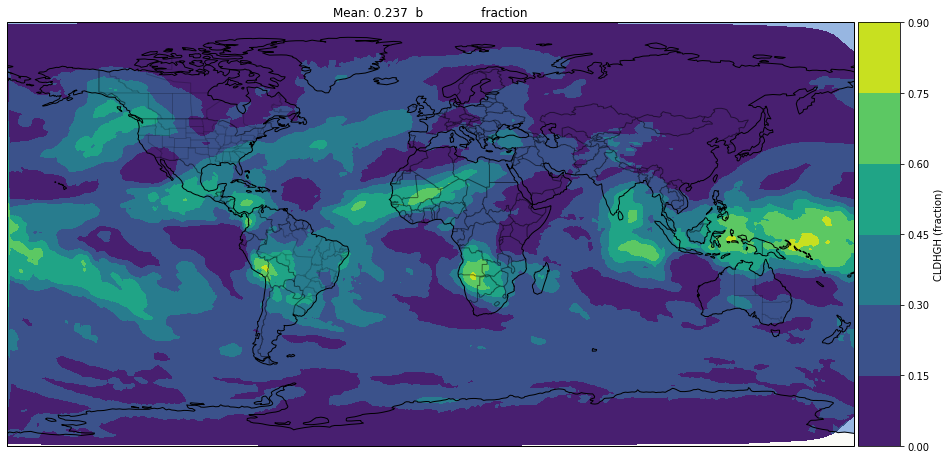

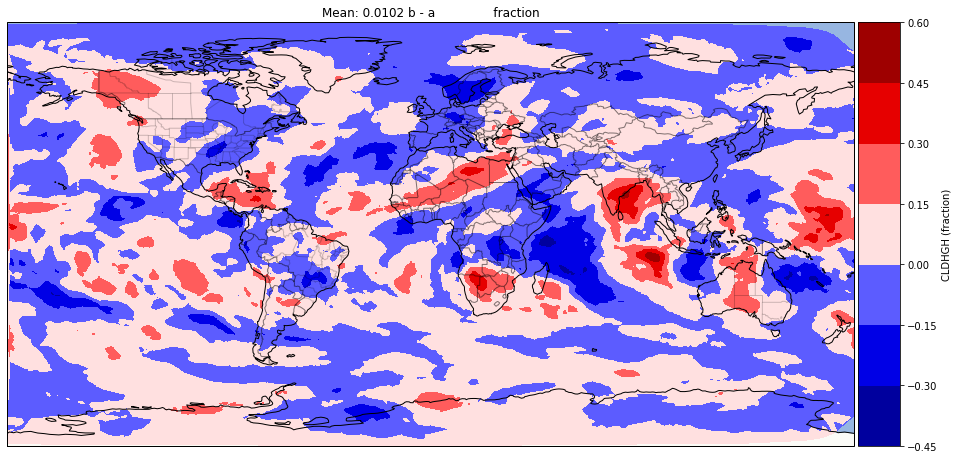

In [28]:
var_list = ['PBLH', 'FLUT', 'FSNTOA', 'LWCF', 'SWCF', 'CLDTOT', 'CLDLOW', 'CLDMED', 'CLDHGH', 'CLOUD', 'LHFLX', 'SHFLX', 'PRECC']
var_list = ['PRECC', 'TGCLDLWP', 'FLUT', 'TGCLDIWP', 'CLDTOT', 'CLDHGH']
kwarg_list = {'PRECC': {'rescale': 86400*1000, 'cmap': cmclimate.cm.WhiteBlueGreenYellowRed, 'levels': range(0,20,2)},
              'CLDTOT': {'levels': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
              'PBLH': {'levels': range(0, 1400, 200)},
              'TGCLDLWP': {'levels': np.arange(0, 0.48, 0.06)},
              #'CLDLOW': {'levels': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
              #'CLDMED': {'levels': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
              #'CLDHGH': {'levels': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
              'CLOUD': {'ilev': -1}}
plt.close('all')
kwargs_delta = {'cmap': cmclimate.cm.BlRe}
for v in var_list:
    if v not in kwarg_list:
        kwargs = {}
    else:
        kwargs = kwarg_list[v]
    try:
        un = dsa[v].attrs['units']
    except:
        un = ''
    figa, _, _, _ = ese.plot_global(v, dsa, name='a', figsize=(16, 12), units=un, **kwargs);
    figb, _, _, _ = ese.plot_global(v, dsb, name='b', figsize=(16, 12), units=un, **kwargs);
    # kwargs['cmap'] = cmclimate.cm.BlRe
    figd, _, _, _ = ese.plot_global(v, ds_delta, name='b - a', figsize=(16, 12), units=un, **kwargs_delta);

In [12]:
kwarg_list = {'PRECC': {'rescale': 86400*1000, 'cmap': cmclimate.cm.WhiteBlueGreenYellowRed, 'levels': range(0,20,2)},
              #'CLDTOT': {'levels': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
              #'CLDLOW': {'levels': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
              #'CLDMED': {'levels': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
              #'CLDHGH': {'levels': [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
              'CLOUD': {'ilev': -1}}

/global/homes/c/crjones/.conda/envs/spe3sm_env/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x2b51a11f6a60> (for post_execute):


ValueError: zero-size array to reduction operation minimum which has no identity

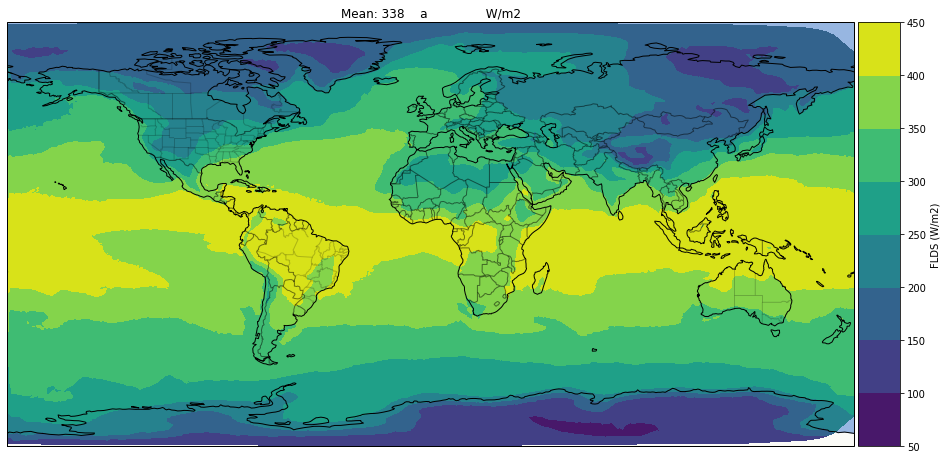

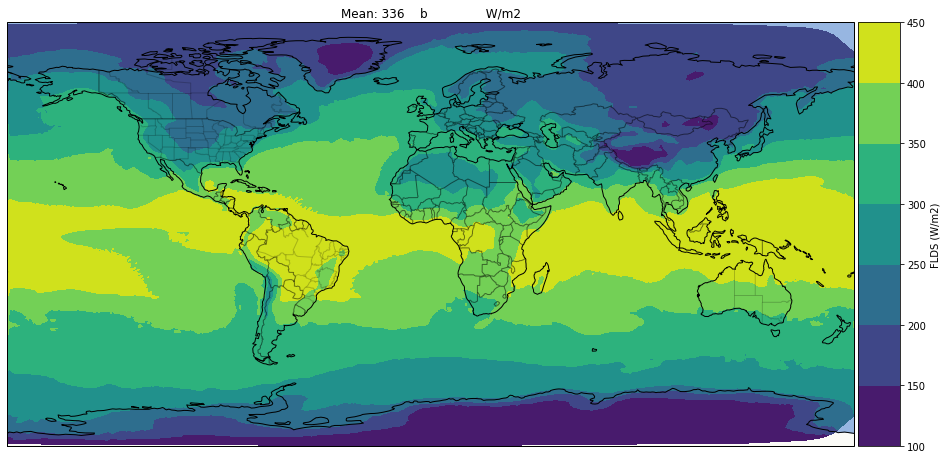

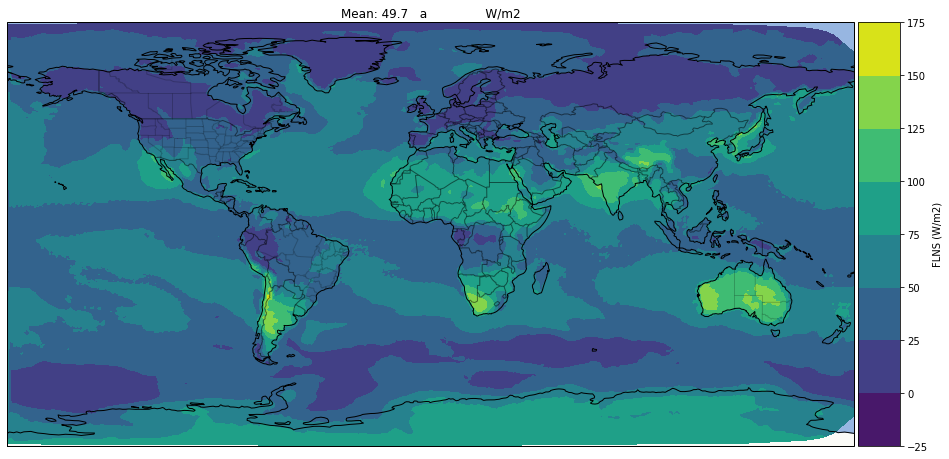

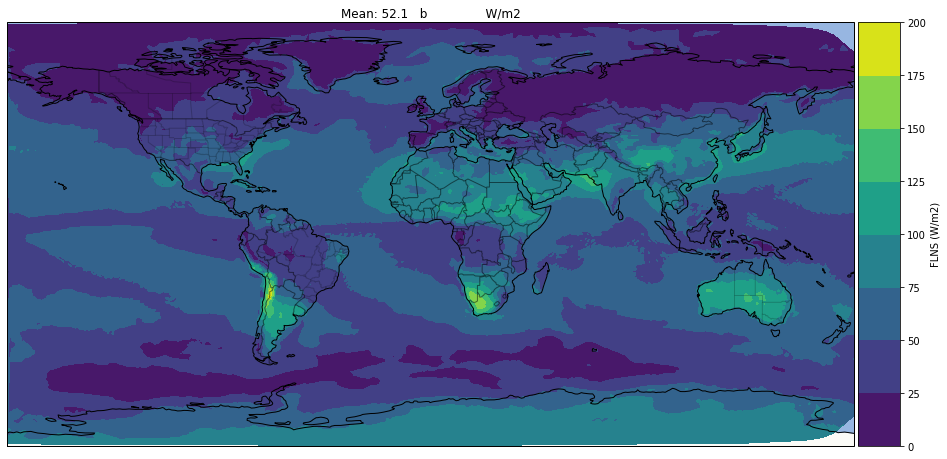

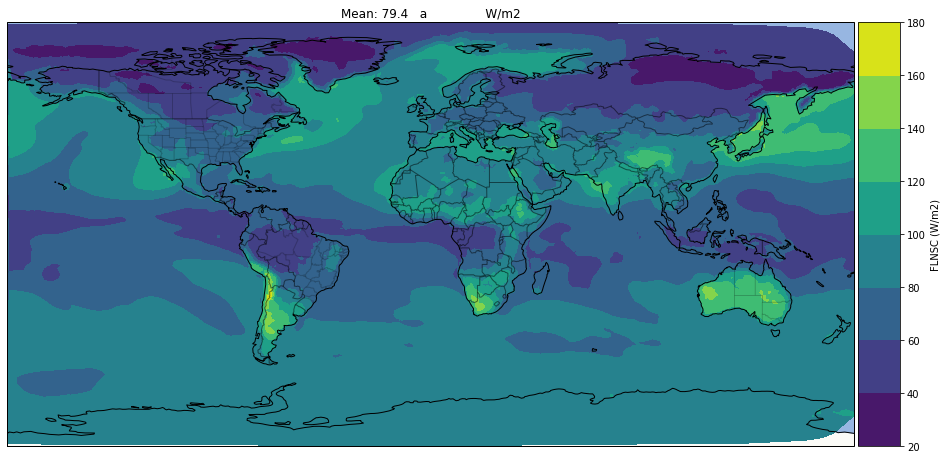

...

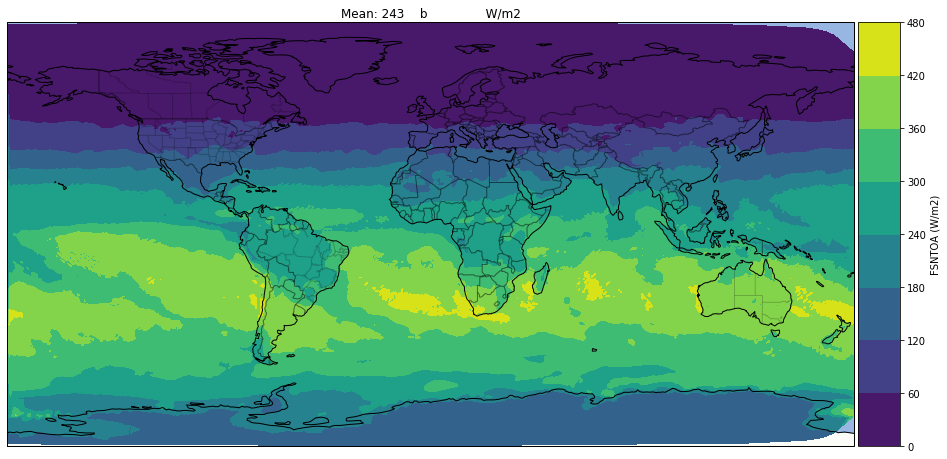

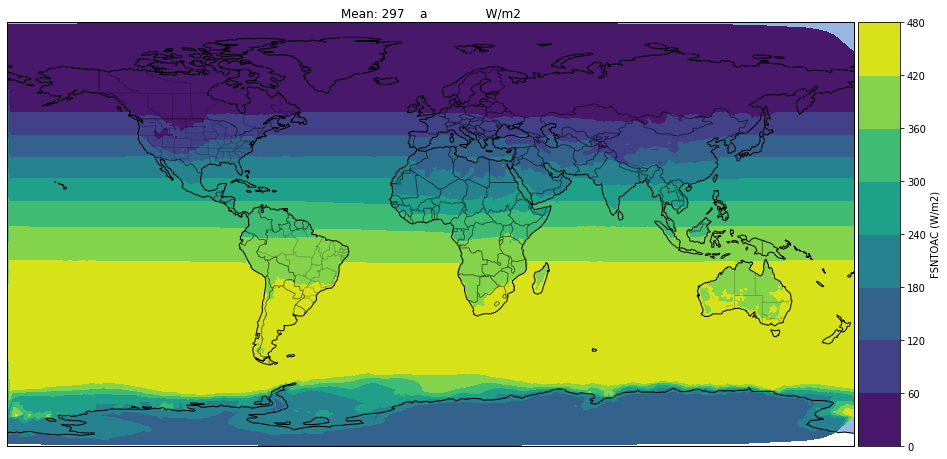

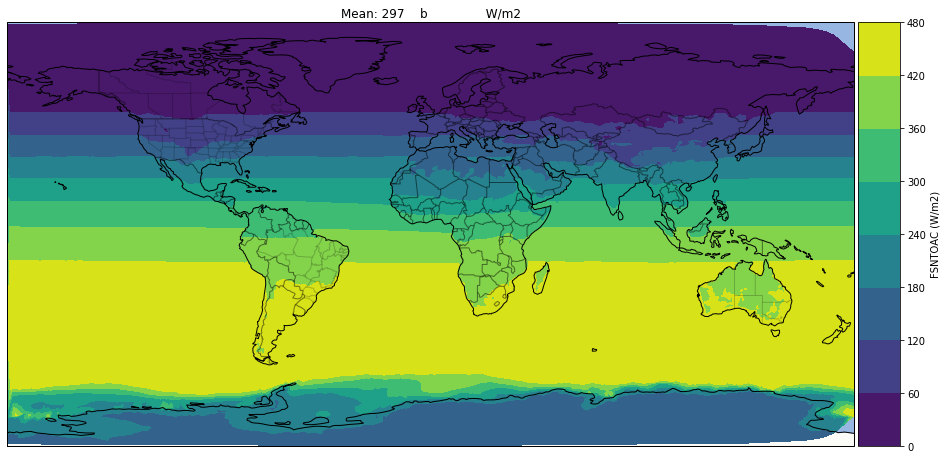

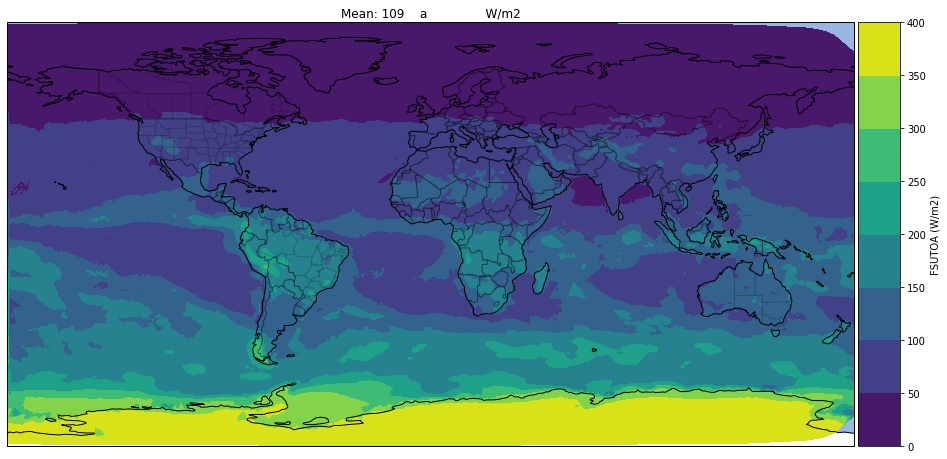

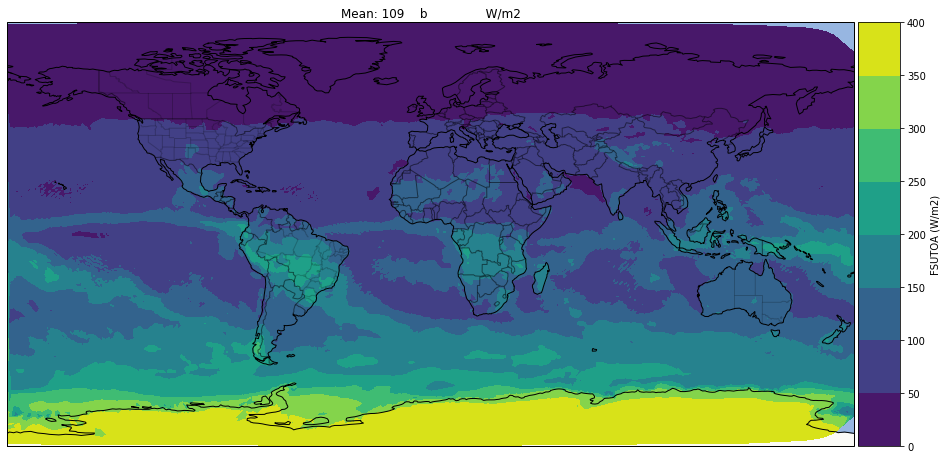

ValueError: zero-size array to reduction operation minimum which has no identity

<Figure size 1152x864 with 2 Axes>

ValueError: zero-size array to reduction operation minimum which has no identity

<Figure size 1152x864 with 2 Axes>

In [14]:
for v in rad_vars:
    if v not in kwarg_list:
        kwargs = {}
    else:
        kwargs = kwarg_list[v]
    figa, _, _, _ = ese.plot_global(v, dsa, name='a', figsize=(16, 12), units=dsa[v].attrs['units'], **kwargs);
    figb, _, _, _ = ese.plot_global(v, dsb, name='b', figsize=(16, 12), units=dsb[v].attrs['units'], **kwargs);